In [17]:
import sys, os
sys.path.append('../')
sys.path.append('../src/')

import torch
import numpy as np
import utils
from torch.nn import Module, Parameter
import torch.optim as opt
from utils import preprocess
import torch.nn.functional as F

import torch.optim as opt
from torch import softmax, log_softmax, Tensor
from sklearn.cluster import KMeans


from sklearn.decomposition import PCA
from umap_batch import UMAP
from utils import re_nn_distance, re_distance_nn

import pandas as pd  
import scipy.sparse as sp
import model
import time

import quantile 

import coupleNMF as coupleNMF

from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


def quantile_norm(targ_mtx, ref_mtx, replace = False):
    # sampling and don't put back
    reference = np.sort(np.random.choice(ref_mtx.reshape(-1), targ_mtx.shape[0] * targ_mtx.shape[1], replace = replace))
    dist_temp = targ_mtx.reshape(-1)
    dist_idx = np.argsort(dist_temp)
    dist_temp[dist_idx] = reference
    return dist_temp.reshape(targ_mtx.shape[0], targ_mtx.shape[1])


In [18]:
import importlib 
importlib.reload(model)

<module 'model' from '../src/model.py'>

## Cell Line Mixture

ATAC
(1047, 29869)
sparsity: 0.0077
RNA
(1047, 4732)
[[1. 0. 2. ... 0. 4. 2.]
 [1. 0. 1. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


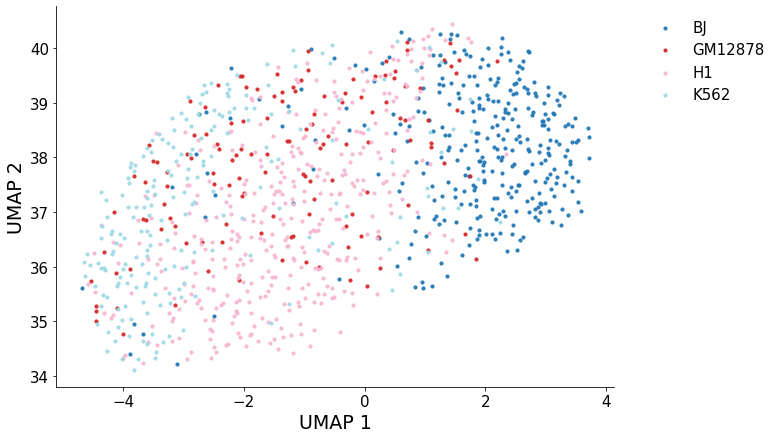

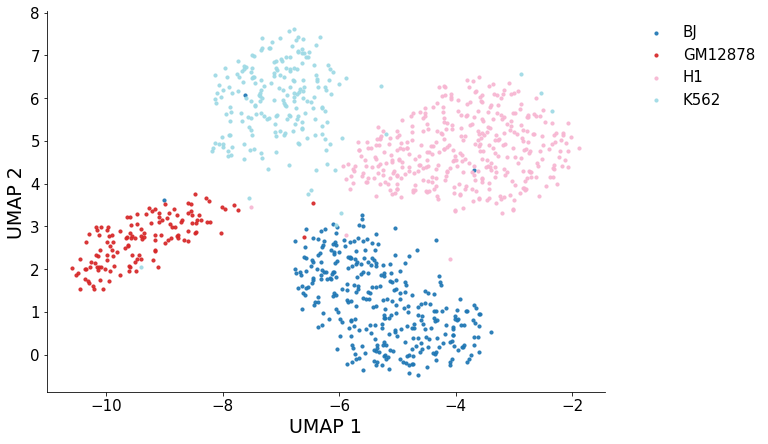

In [33]:
# read in dataset
dir = '../data/real/vert/CellLineMixture/'

counts_rnas = []
counts_atacs = []
counts_proteins = []
labels = []
for batch in [1, 2]:
    try:
        labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    except:
        labels.append(labels[-1])
    
    try:
        counts_atac = np.array(sp.load_npz(os.path.join(dir, 'RxC' + str(batch) + ".npz")).todense().T)
        print("ATAC")
        print(counts_atac.shape)
        counts_atac = utils.preprocess(counts_atac, modality = "ATAC")
        print("sparsity: {:.4f}".format(np.sum(counts_atac != 0)/(counts_atac.shape[0] * counts_atac.shape[1])))
        
        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_atac)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")
        
    except:
        counts_atac = None
        
    try:
        counts_rna = np.array(sp.load_npz(os.path.join(dir, 'GxC' + str(batch) + ".npz")).todense().T)
        print("RNA")
        print(counts_rna.shape)
        print(counts_rna)
        counts_rna = utils.preprocess(counts_rna, modality = "RNA")

        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_rna)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")

    except:
        counts_rna = None
    
    # preprocess the count matrix
    counts_rnas.append(counts_rna)
    counts_atacs.append(counts_atac)

# make the ATAC and RNA from different batches
counts_rnas = [counts_rnas[1], counts_rnas[0]]

counts = {"rna":counts_rnas, "atac": counts_atacs}

A = sp.load_npz(os.path.join(dir, 'GxR.npz'))
A = np.array(A.todense())
# normalize A
A = utils.preprocess(A, modality = "interaction")
interacts = {"rna_atac": A}


# obtain the feature name
genes = pd.read_csv(dir + "genes.txt", header = None).values.squeeze()
regions = pd.read_csv(dir + "regions.txt", header = None).values.squeeze()

feats_name = {"rna": genes, "atac": regions}
counts["feats_name"] = feats_name

Input sanity check...
Finished.
Epoch 1000, Validating Loss: 13.2120
	 loss 1: 0.01815
	 loss 2: 0.00044
	 loss 3: -0.98792
Epoch 2000, Validating Loss: 13.1442
	 loss 1: 0.01807
	 loss 2: 0.00153
	 loss 3: -0.98511
Epoch 3000, Validating Loss: 13.0733
	 loss 1: 0.01799
	 loss 2: 0.00303
	 loss 3: -0.98428
Epoch 4000, Validating Loss: 13.0373
	 loss 1: 0.01795
	 loss 2: 0.00242
	 loss 3: -0.98372
Epoch 5000, Validating Loss: 13.0159
	 loss 1: 0.01793
	 loss 2: 0.00287
	 loss 3: -0.98345
Epoch 6000, Validating Loss: 13.0097
	 loss 1: 0.01792
	 loss 2: 0.00311
	 loss 3: -0.98237
running time: 92.91778874397278


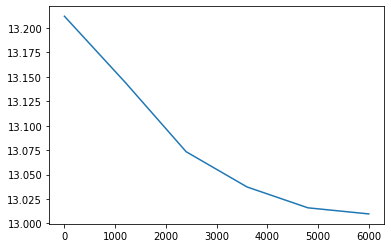

In [31]:
#hyper parameters: best lr = 5e-3, T = 4000, latent_dims = 13
alpha = [1000, 1, 5]
batchsize = 0.1
run = 0
K = 30
Ns = [K] * 2
N_feat = Ns[0]
interval = 1000
T = 6000
lr = 1e-2

# use interaction matrix
start_time = time.time()
model1 = model.cfrm_vanilla(counts = counts, interacts = interacts, Ns = Ns, K = K, N_feat = N_feat, batch_size = batchsize, interval = interval, lr = lr, alpha = alpha, seed = run).to(device)
losses1 = model1.train_func(T = T)
end_time = time.time()
print("running time: " + str(end_time - start_time))

x = np.linspace(0, T, int(T/interval))
plt.plot(x, losses1)

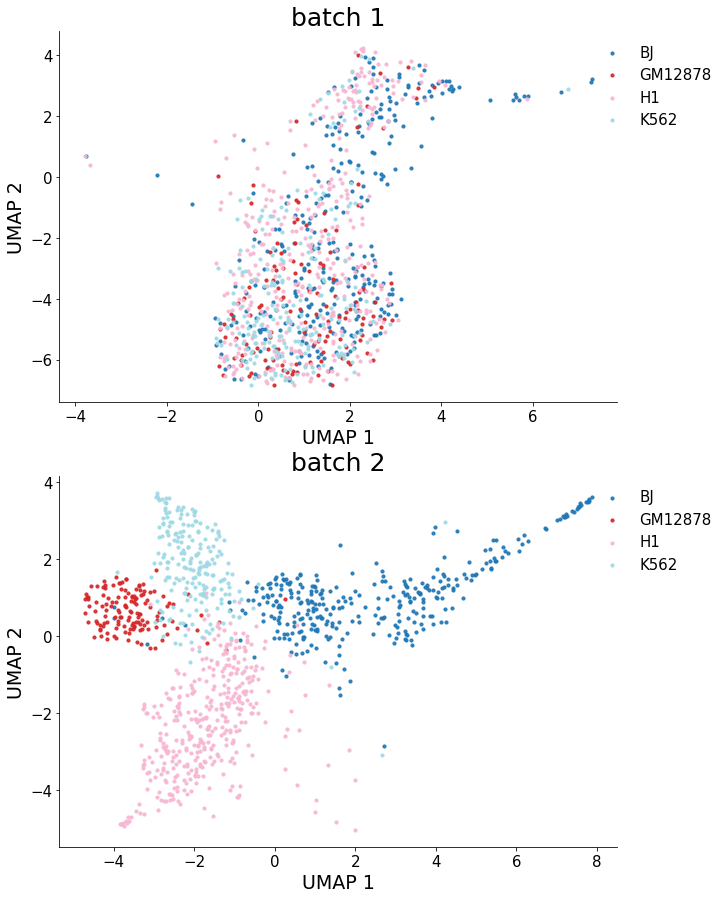

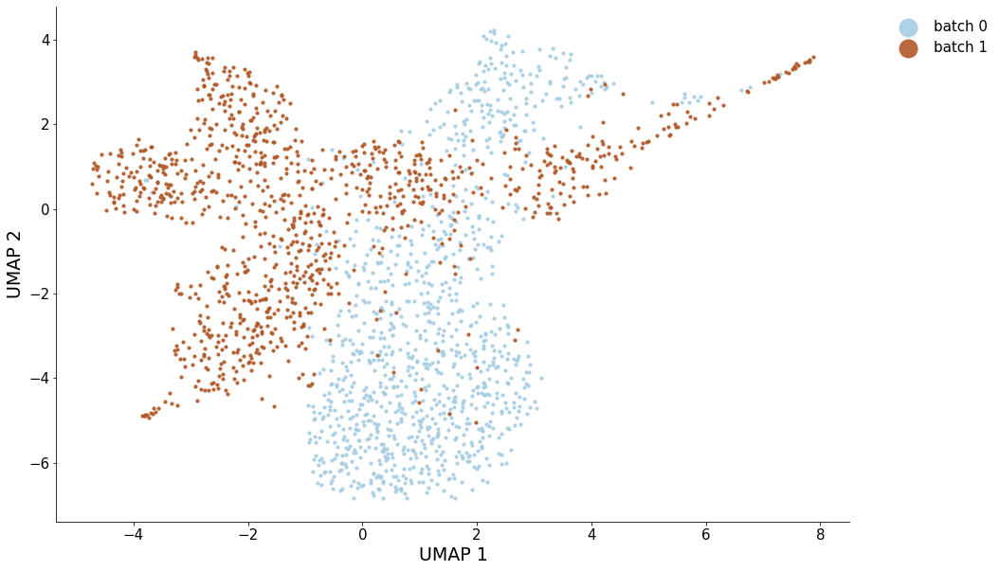

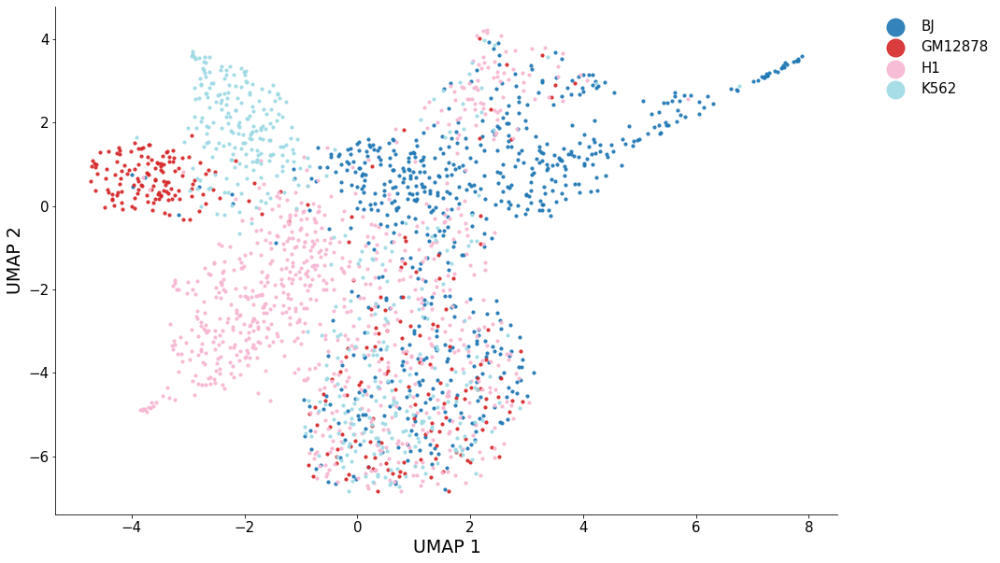

In [34]:
umap_op = UMAP(n_components = 2, n_neighbors = 15, min_dist = 0.4, random_state = 0) 
zs = []

for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    zs.append(z)

x_umap = umap_op.fit_transform(np.concatenate(zs, axis = 0))
# separate into batches
x_umaps = []
for batch in range(0,2):
    if batch == 0:
        start_pointer = 0
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])
    elif batch == 1:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        x_umaps.append(x_umap[start_pointer:,:])
    else:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, figsize = (10,15), axis_label = "UMAP")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)


ATAC
(1047, 29869)
sparsity: 0.0077
RNA
(1047, 4732)
[[1. 0. 2. ... 0. 4. 2.]
 [1. 0. 1. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


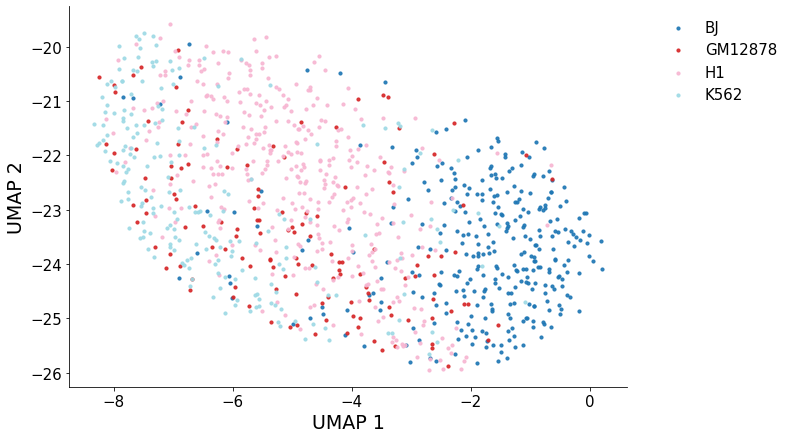

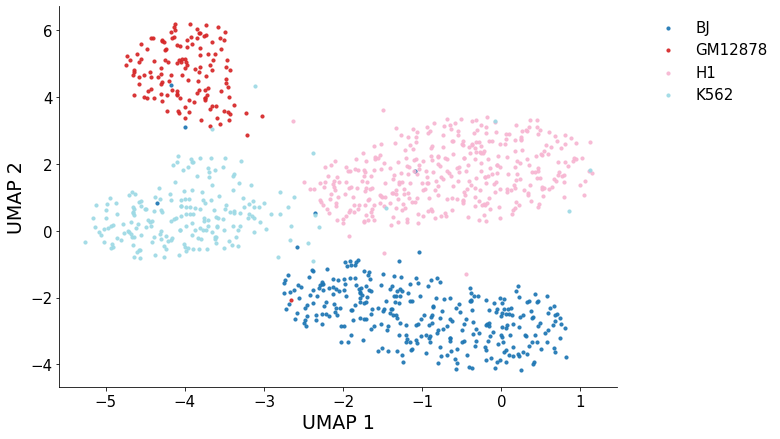

In [36]:
# read in dataset
dir = '../data/real/vert/CellLineMixture/'

counts_rnas = []
counts_atacs = []
counts_proteins = []
labels = []
for batch in [1, 2]:
    try:
        labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    except:
        labels.append(labels[-1])
    
    try:
        counts_atac = np.array(sp.load_npz(os.path.join(dir, 'RxC' + str(batch) + ".npz")).todense().T)
        print("ATAC")
        print(counts_atac.shape)
        counts_atac = utils.preprocess(counts_atac, modality = "ATAC")
        print("sparsity: {:.4f}".format(np.sum(counts_atac != 0)/(counts_atac.shape[0] * counts_atac.shape[1])))
        
        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_atac)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")
        
    except:
        counts_atac = None
        
    try:
        counts_rna = np.array(sp.load_npz(os.path.join(dir, 'GxC' + str(batch) + ".npz")).todense().T)
        print("RNA")
        print(counts_rna.shape)
        print(counts_rna)
        counts_rna = utils.preprocess(counts_rna, modality = "RNA")

        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_rna)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")

    except:
        counts_rna = None
    
    # preprocess the count matrix
    counts_rnas.append(counts_rna)
    counts_atacs.append(counts_atac)

# make the ATAC and RNA from different batches
counts_rnas = [counts_rnas[1], counts_rnas[0]]

counts = {"rna":counts_rnas, "atac": counts_atacs}

A = sp.load_npz(os.path.join(dir, 'GxR.npz'))
A = np.array(A.todense())
# normalize A
A = utils.preprocess(A, modality = "interaction")
interacts = {"rna_atac": A}


# obtain the feature name
genes = pd.read_csv(dir + "genes.txt", header = None).values.squeeze()
regions = pd.read_csv(dir + "regions.txt", header = None).values.squeeze()

feats_name = {"rna": genes, "atac": regions}
counts["feats_name"] = feats_name

# new
counts["rna"][0] = counts["atac"][0] @ interacts["rna_atac"].T
interacts = None

# normalization? 
# quantile
# counts["rna"][1] = quantile_norm(targ_mtx = counts["rna"][1], ref_mtx = counts["rna"][0], replace = True)
# counts["rna"][1] = utils.preprocess(counts["rna"][1], modality = "RNA")

Input sanity check...
Finished.
Epoch 1000, Validating Loss: 21.8221
	 loss 1: 0.02182
	 loss 2: 0.00093
	 loss 3: 0.00000
Epoch 2000, Validating Loss: 21.6417
	 loss 1: 0.02164
	 loss 2: 0.00180
	 loss 3: 0.00000
Epoch 3000, Validating Loss: 21.5431
	 loss 1: 0.02154
	 loss 2: 0.00494
	 loss 3: 0.00000
Epoch 4000, Validating Loss: 21.4661
	 loss 1: 0.02146
	 loss 2: 0.00321
	 loss 3: 0.00000
Epoch 5000, Validating Loss: 21.4226
	 loss 1: 0.02142
	 loss 2: 0.00388
	 loss 3: 0.00000
Epoch 6000, Validating Loss: 21.3830
	 loss 1: 0.02138
	 loss 2: 0.00425
	 loss 3: 0.00000
Epoch 7000, Validating Loss: 21.3481
	 loss 1: 0.02134
	 loss 2: 0.00418
	 loss 3: 0.00000
Epoch 8000, Validating Loss: 21.3188
	 loss 1: 0.02131
	 loss 2: 0.00423
	 loss 3: 0.00000
Epoch 9000, Validating Loss: 21.2960
	 loss 1: 0.02129
	 loss 2: 0.00331
	 loss 3: 0.00000
Epoch 10000, Validating Loss: 21.2745
	 loss 1: 0.02127
	 loss 2: 0.00415
	 loss 3: 0.00000
Epoch 11000, Validating Loss: 21.2517
	 loss 1: 0.02125
	

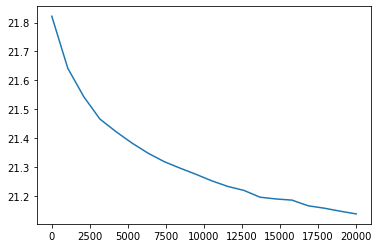

In [42]:
#hyper parameters: best lr = 5e-3, T = 4000, latent_dims = 13
alpha = [1000, 1, 5]
batchsize = 0.1
run = 0
K = 30
Ns = [K] * 2
N_feat = Ns[0]
interval = 1000
T = 20000
lr = 1e-2

# use interaction matrix
start_time = time.time()
model1 = model.cfrm_vanilla(counts = counts, interacts = interacts, Ns = Ns, K = K, N_feat = N_feat, batch_size = batchsize, interval = interval, lr = lr, alpha = alpha, seed = run).to(device)
losses1 = model1.train_func(T = T)
end_time = time.time()
print("running time: " + str(end_time - start_time))

x = np.linspace(0, T, int(T/interval))
plt.plot(x, losses1)

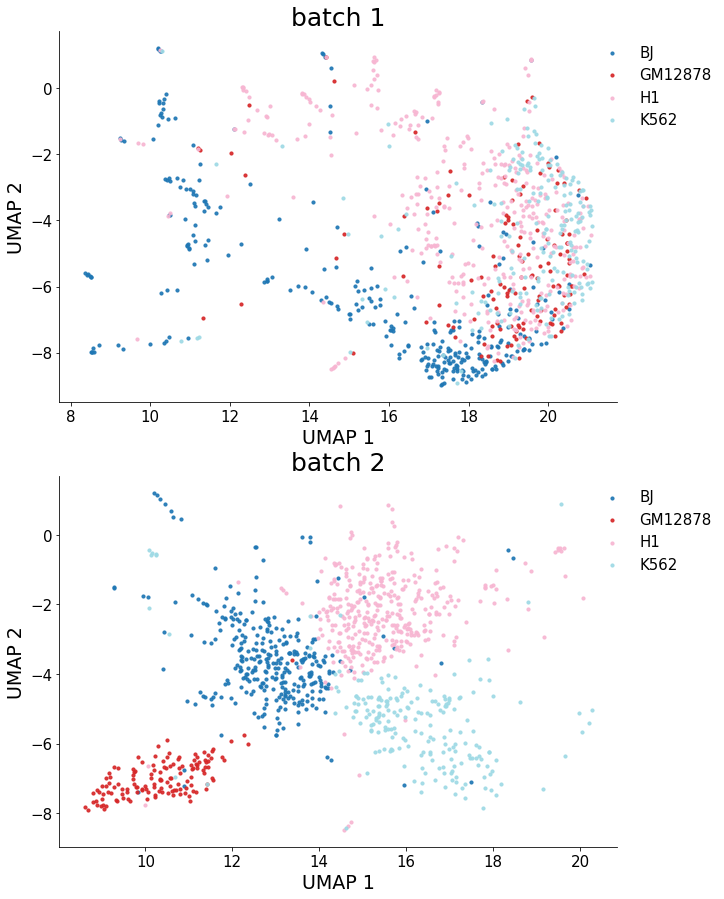

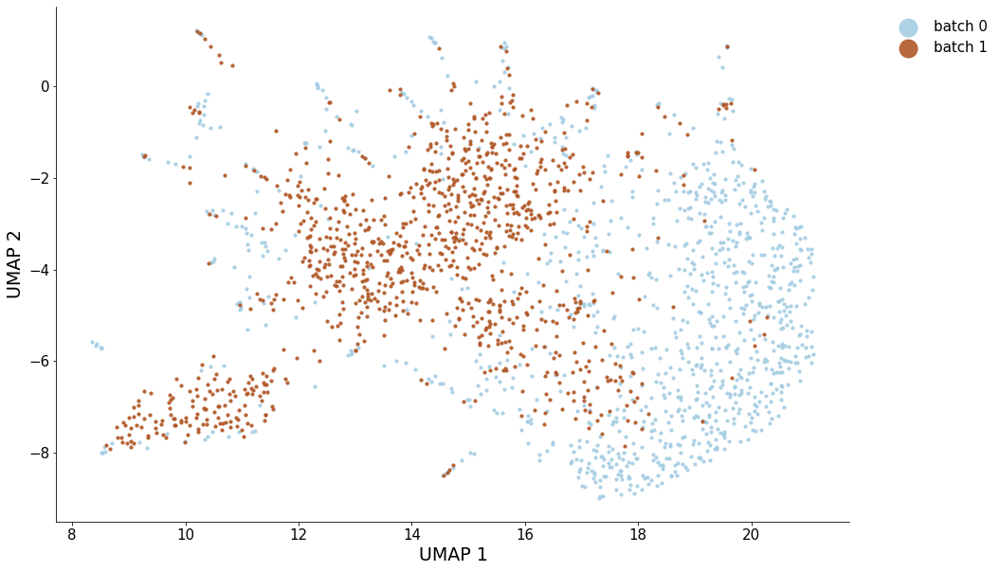

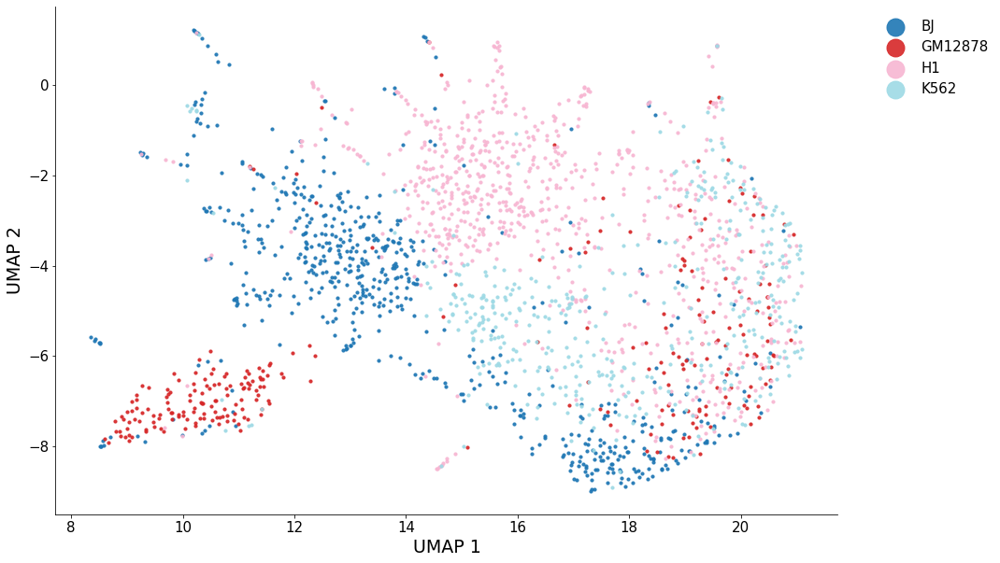

In [43]:
umap_op = UMAP(n_components = 2, n_neighbors = 15, min_dist = 0.4, random_state = 0) 
zs = []

for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    zs.append(z)

x_umap = umap_op.fit_transform(np.concatenate(zs, axis = 0))
# separate into batches
x_umaps = []
for batch in range(0,2):
    if batch == 0:
        start_pointer = 0
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])
    elif batch == 1:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        x_umaps.append(x_umap[start_pointer:,:])
    else:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, figsize = (10,15), axis_label = "UMAP")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)


../src/umap_batch.py:1746: UserWarning: using precomputed metric; transform will be unavailable for new data and inverse_transform will be unavailable for all data
  warn(


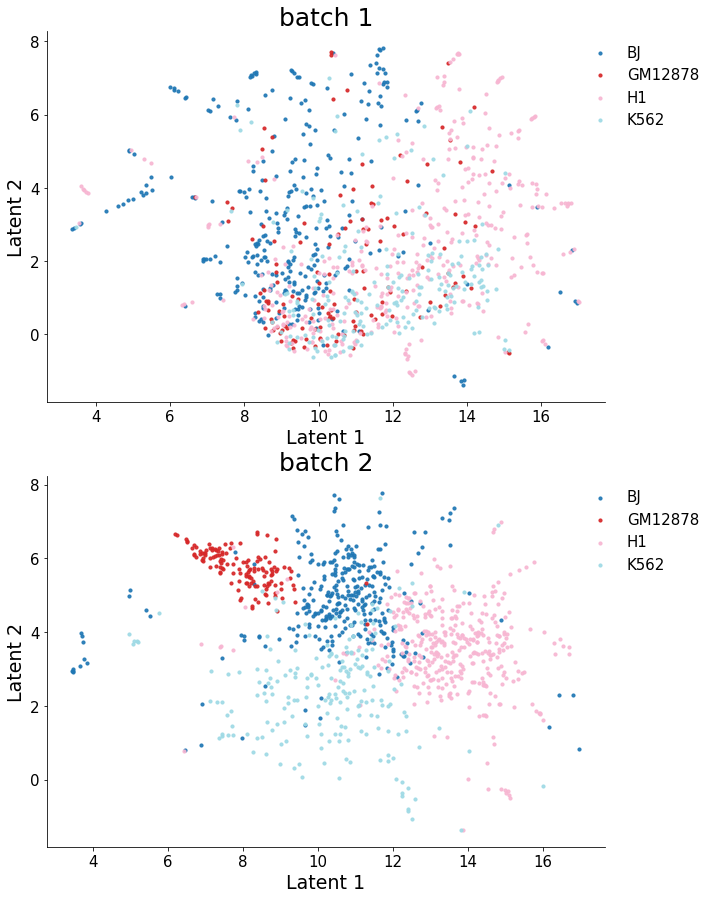

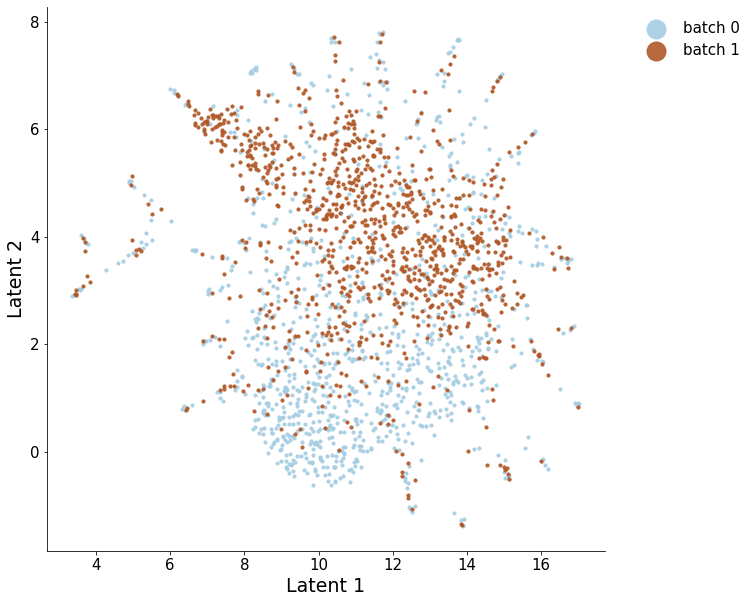

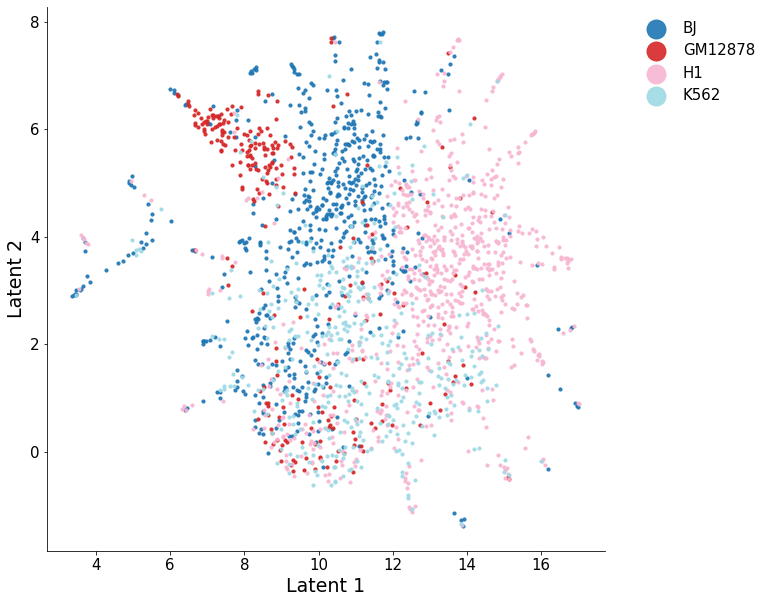

In [44]:
n_neighbors = 10

zs = []
for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    zs.append(z)
    
s_pair_dist, knn_indices, knn_dists = re_nn_distance(zs, n_neighbors)

umap_op = UMAP(n_components = 2, n_neighbors = n_neighbors, min_dist = 0.4, random_state = 0, 
                metric='precomputed', knn_dists=knn_dists, knn_indices=knn_indices)
x_umap = umap_op.fit_transform(s_pair_dist)
# separate into batches
x_umaps = []
for batch in range(0,2):
    if batch == 0:
        start_pointer = 0
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])
    elif batch == 1:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        x_umaps.append(x_umap[start_pointer:,:])
    else:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, 
                      figsize = (10,15), axis_label = "Latent")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, 
                      figsize = (10,10), axis_label = "Latent", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, 
                      figsize = (10,10), axis_label = "Latent", markerscale = 6)


## Spleen

RNA
(4382, 2708)
[[1 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 1 0 ... 0 1 0]
 [0 1 0 ... 0 0 0]]
ATAC
(3166, 20435)
sparsity: 0.1534


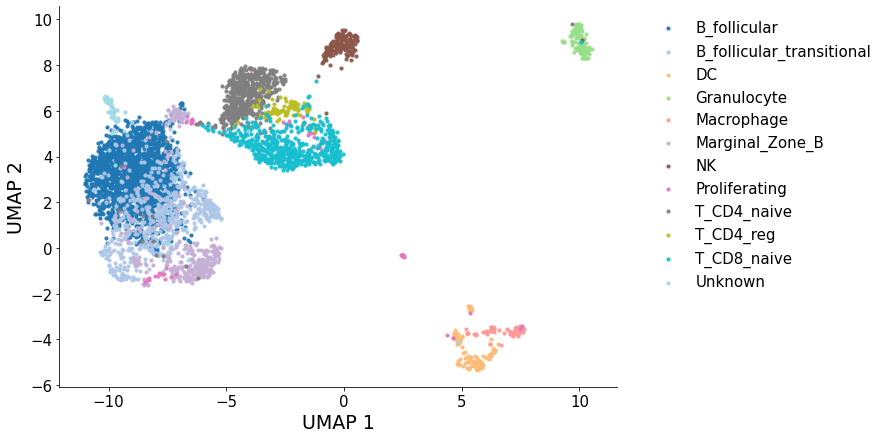

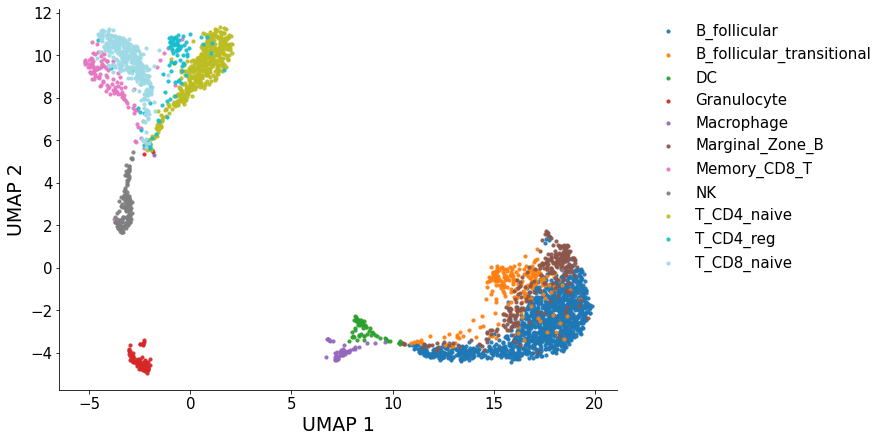

In [8]:
# read in dataset
dir = '../data/real/diag/Xichen/'

counts_rnas = []
counts_atacs = []
counts_proteins = []
labels = []
for batch in [1, 2]:
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    
    try:
        counts_atac = np.array(sp.load_npz(os.path.join(dir, 'RxC' + str(batch) + ".npz")).todense().T)
        print("ATAC")
        print(counts_atac.shape)
        counts_atac = utils.preprocess(counts_atac, modality = "ATAC")
        print("sparsity: {:.4f}".format(np.sum(counts_atac != 0)/(counts_atac.shape[0] * counts_atac.shape[1])))
        
        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_atac)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")
        
    except:
        counts_atac = None
        
    try:
        counts_rna = np.array(sp.load_npz(os.path.join(dir, 'GxC' + str(batch) + ".npz")).todense().T)
        print("RNA")
        print(counts_rna.shape)
        print(counts_rna)
        counts_rna = utils.preprocess(counts_rna, modality = "RNA")

        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_rna)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")

    except:
        counts_rna = None
    
    # preprocess the count matrix
    counts_rnas.append(counts_rna)
    counts_atacs.append(counts_atac)

counts = {"rna":counts_rnas, "atac": counts_atacs}

A = sp.load_npz(os.path.join(dir, 'GxR.npz'))
A = np.array(A.todense())
# normalize A
A = utils.preprocess(A, modality = "interaction")
interacts = {"rna_atac": A}


# obtain the feature name
genes = pd.read_csv(dir + "genes.txt", header = None).values.squeeze()
regions = pd.read_csv(dir + "regions.txt", header = None).values.squeeze()

feats_name = {"rna": genes, "atac": regions}
counts["feats_name"] = feats_name

Input sanity check...
Finished.
Epoch 1000, Validating Loss: 78.4758
	 loss 1: 0.08330
	 loss 2: 0.00056
	 loss 3: -0.96442
Epoch 2000, Validating Loss: 77.6742
	 loss 1: 0.08251
	 loss 2: 0.00246
	 loss 3: -0.96811
Epoch 3000, Validating Loss: 77.3872
	 loss 1: 0.08224
	 loss 2: 0.00279
	 loss 3: -0.97069
Epoch 4000, Validating Loss: 77.2206
	 loss 1: 0.08208
	 loss 2: 0.00216
	 loss 3: -0.97213
Epoch 5000, Validating Loss: 77.1022
	 loss 1: 0.08196
	 loss 2: 0.00228
	 loss 3: -0.97292
Epoch 6000, Validating Loss: 76.9963
	 loss 1: 0.08186
	 loss 2: 0.00255
	 loss 3: -0.97387
running time: 93.91280102729797


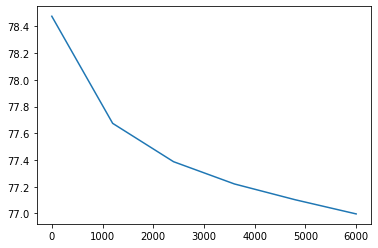

In [9]:
#hyper parameters: best lr = 5e-3, T = 4000, latent_dims = 13
alpha = [1000, 1, 5]
batchsize = 0.1
run = 0
K = 30
Ns = [K] * 2
N_feat = Ns[0]
interval = 1000
T = 6000
lr = 1e-2

# use interaction matrix
start_time = time.time()
model1 = model.cfrm_vanilla(counts = counts, interacts = interacts, Ns = Ns, K = K, N_feat = N_feat, batch_size = batchsize, interval = interval, lr = lr, alpha = alpha, seed = run).to(device)
losses1 = model1.train_func(T = T)
end_time = time.time()
print("running time: " + str(end_time - start_time))

x = np.linspace(0, T, int(T/interval))
plt.plot(x, losses1)

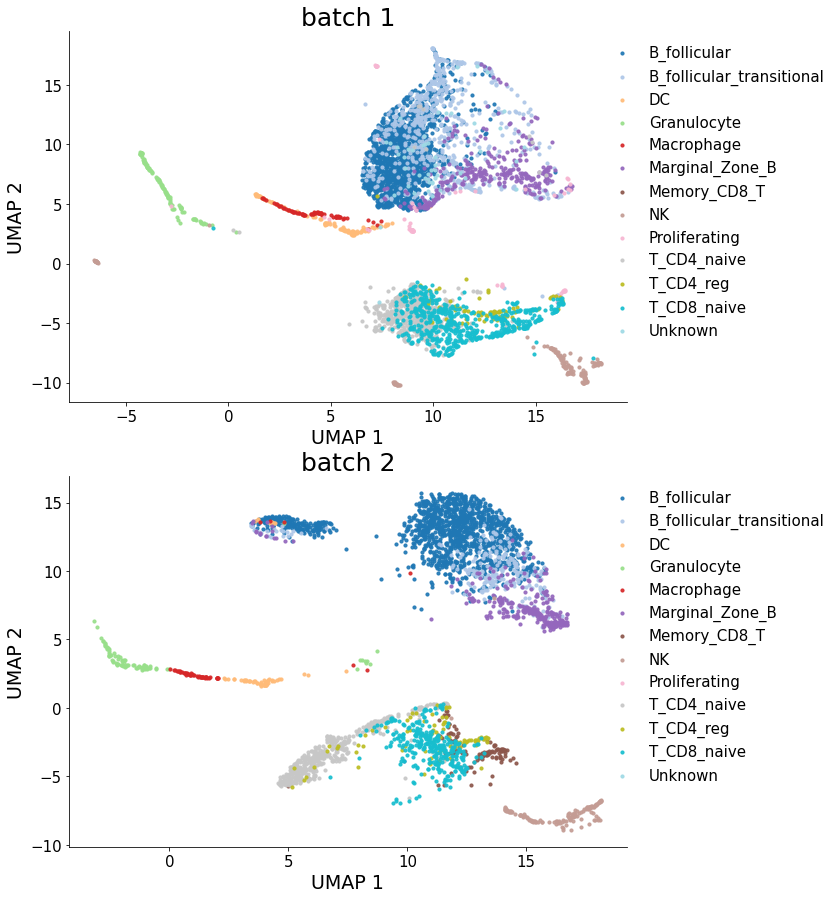

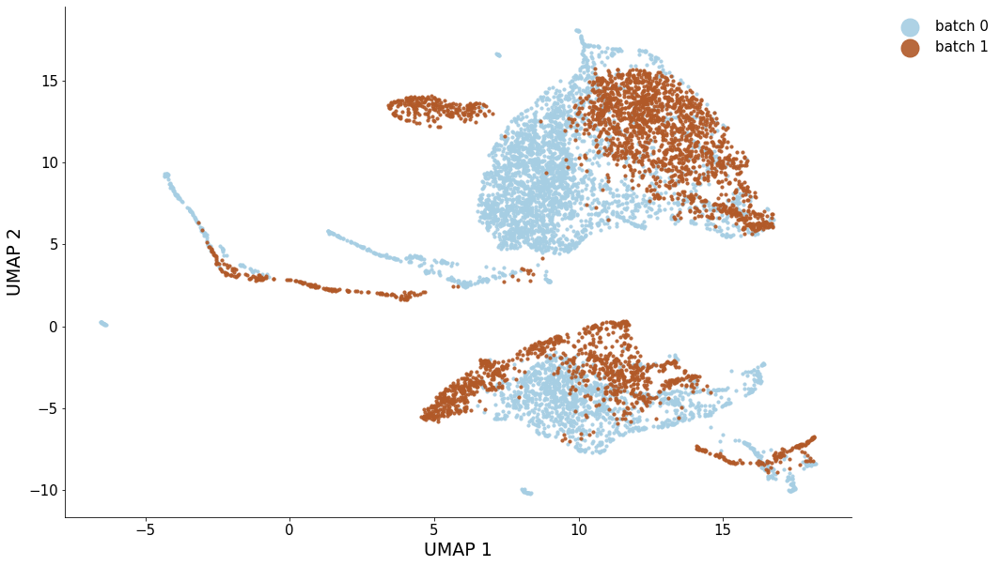

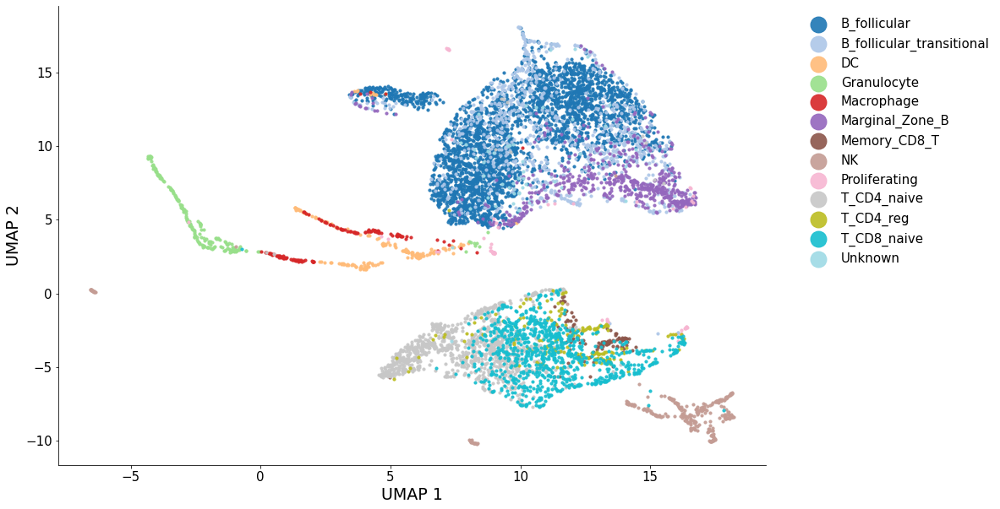

In [10]:
umap_op = UMAP(n_components = 2, n_neighbors = 15, min_dist = 0.4, random_state = 0) 
zs = []
labels = []
prec_labels = []
pre_labels = []
for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    # z = model1.C_cells[batch].cpu().detach().numpy()
    zs.append(z)
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch + 1) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    pre_labels.append(np.argmax(z, axis = 1).squeeze())

x_umap = umap_op.fit_transform(np.concatenate(zs, axis = 0))
# separate into batches
x_umaps = []
for batch in range(0,2):
    if batch == 0:
        start_pointer = 0
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])
    elif batch == 1:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        x_umaps.append(x_umap[start_pointer:,:])
    else:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, figsize = (10,15), axis_label = "UMAP")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)


../src/umap_batch.py:1746: UserWarning: using precomputed metric; transform will be unavailable for new data and inverse_transform will be unavailable for all data
  warn(


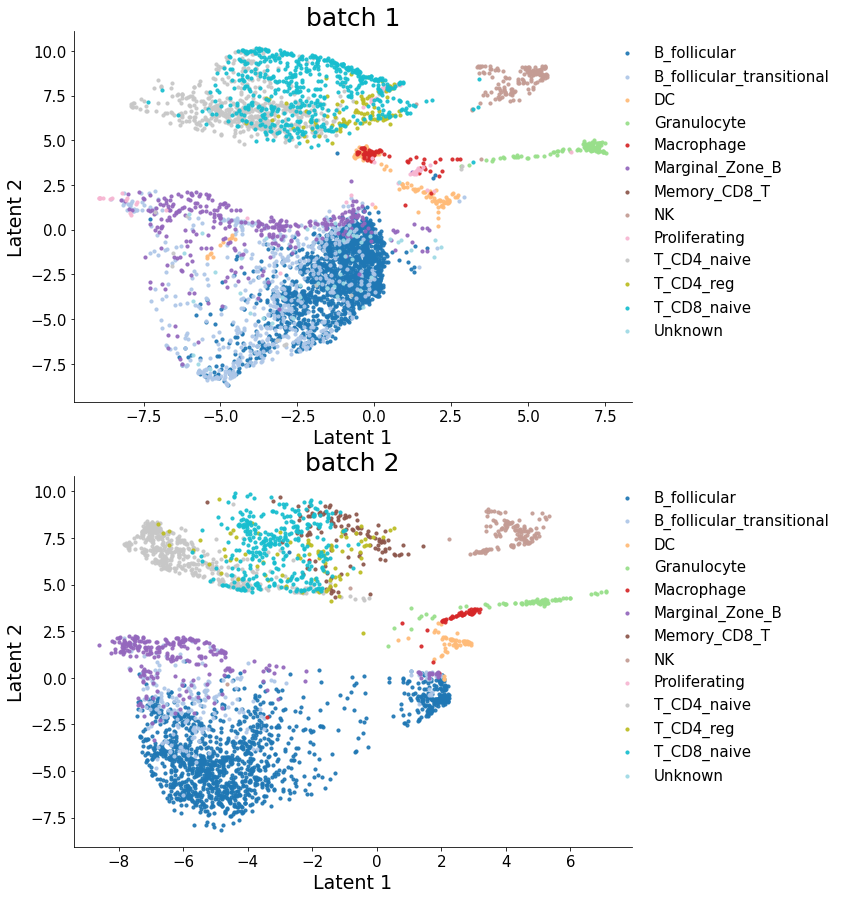

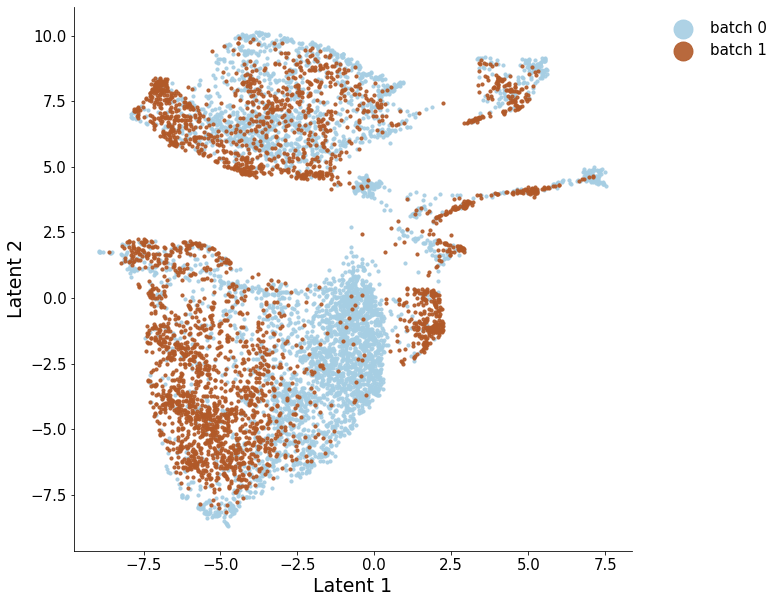

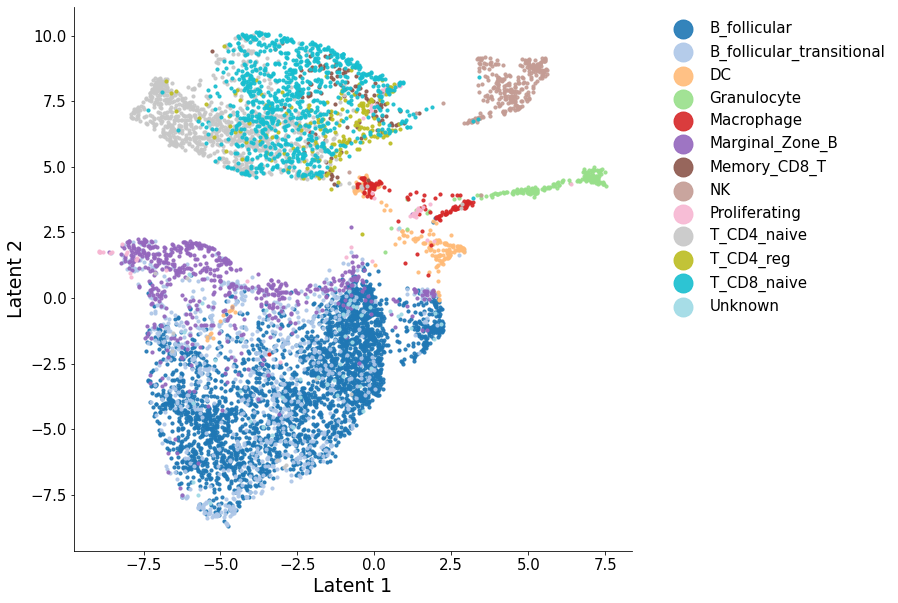

In [11]:
n_neighbors = 10

zs = []
labels = []
prec_labels = []
pre_labels = []
for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    # z = model1.C_cells[batch].cpu().detach().numpy()
    zs.append(z)
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch + 1) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    pre_labels.append(np.argmax(z, axis = 1).squeeze())

s_pair_dist, knn_indices, knn_dists = re_nn_distance(zs, n_neighbors)

umap_op = UMAP(n_components = 2, n_neighbors = n_neighbors, min_dist = 0.4, random_state = 0, 
                metric='precomputed', knn_dists=knn_dists, knn_indices=knn_indices)
x_umap = umap_op.fit_transform(s_pair_dist)
# separate into batches
x_umaps = []
for batch in range(0,2):
    if batch == 0:
        start_pointer = 0
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])
    elif batch == 1:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        x_umaps.append(x_umap[start_pointer:,:])
    else:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, 
                      figsize = (10,15), axis_label = "Latent")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, 
                      figsize = (10,10), axis_label = "Latent", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, 
                      figsize = (10,10), axis_label = "Latent", markerscale = 6)


In [13]:
# read in dataset
dir = '../data/real/diag/Xichen/'

counts_rnas = []
counts_atacs = []
counts_proteins = []
labels = []
for batch in [1, 2]:
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    
    try:
        counts_atac = np.array(sp.load_npz(os.path.join(dir, 'RxC' + str(batch) + ".npz")).todense().T)
        print("ATAC")
        print(counts_atac.shape)
        counts_atac = utils.preprocess(counts_atac, modality = "ATAC")
        print("sparsity: {:.4f}".format(np.sum(counts_atac != 0)/(counts_atac.shape[0] * counts_atac.shape[1])))
        '''
        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_atac)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")
        '''
    except:
        counts_atac = None
        
    try:
        counts_rna = np.array(sp.load_npz(os.path.join(dir, 'GxC' + str(batch) + ".npz")).todense().T)
        print("RNA")
        print(counts_rna.shape)
        print(counts_rna)
        counts_rna = utils.preprocess(counts_rna, modality = "RNA")
        '''
        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_rna)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")
        '''
    except:
        counts_rna = None
    
    # preprocess the count matrix
    counts_rnas.append(counts_rna)
    counts_atacs.append(counts_atac)

counts = {"rna":counts_rnas, "atac": counts_atacs}

A = sp.load_npz(os.path.join(dir, 'GxR.npz'))
A = np.array(A.todense())
# normalize A
A = utils.preprocess(A, modality = "interaction")
interacts = {"rna_atac": A}


# obtain the feature name
genes = pd.read_csv(dir + "genes.txt", header = None).values.squeeze()
regions = pd.read_csv(dir + "regions.txt", header = None).values.squeeze()

feats_name = {"rna": genes, "atac": regions}
counts["feats_name"] = feats_name

# new
counts["rna"][1] = counts["atac"][1] @ interacts["rna_atac"].T
interacts = None

# quantile? 

RNA
(4382, 2708)
[[1 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 1 0 ... 0 1 0]
 [0 1 0 ... 0 0 0]]
ATAC
(3166, 20435)
sparsity: 0.1534


Input sanity check...
Finished.
Epoch 1000, Validating Loss: 124.2931
	 loss 1: 0.12429
	 loss 2: 0.00059
	 loss 3: 0.00000
Epoch 2000, Validating Loss: 123.3525
	 loss 1: 0.12335
	 loss 2: 0.00304
	 loss 3: 0.00000
Epoch 3000, Validating Loss: 122.9464
	 loss 1: 0.12294
	 loss 2: 0.00425
	 loss 3: 0.00000
Epoch 4000, Validating Loss: 122.7163
	 loss 1: 0.12271
	 loss 2: 0.00327
	 loss 3: 0.00000
Epoch 5000, Validating Loss: 122.5287
	 loss 1: 0.12253
	 loss 2: 0.00321
	 loss 3: 0.00000
Epoch 6000, Validating Loss: 122.3979
	 loss 1: 0.12239
	 loss 2: 0.00366
	 loss 3: 0.00000
running time: 99.85724449157715


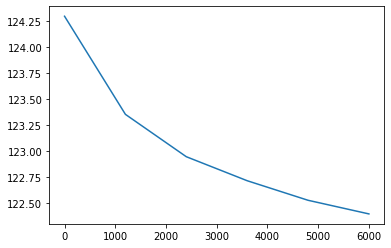

In [14]:
#hyper parameters: best lr = 5e-3, T = 4000, latent_dims = 13
alpha = [1000, 1, 5]
# alpha = [1000, 0, 0]
batchsize = 0.1
run = 0
K = 30
Ns = [K] * 2
N_feat = Ns[0]
interval = 1000
T = 6000
lr = 1e-2

# use interaction matrix
start_time = time.time()
model1 = model.cfrm_vanilla(counts = counts, interacts = interacts, Ns = Ns, K = K, N_feat = N_feat, batch_size = batchsize, interval = interval, lr = lr, alpha = alpha, seed = run).to(device)
losses1 = model1.train_func(T = T)
end_time = time.time()
print("running time: " + str(end_time - start_time))

x = np.linspace(0, T, int(T/interval))
plt.plot(x, losses1)

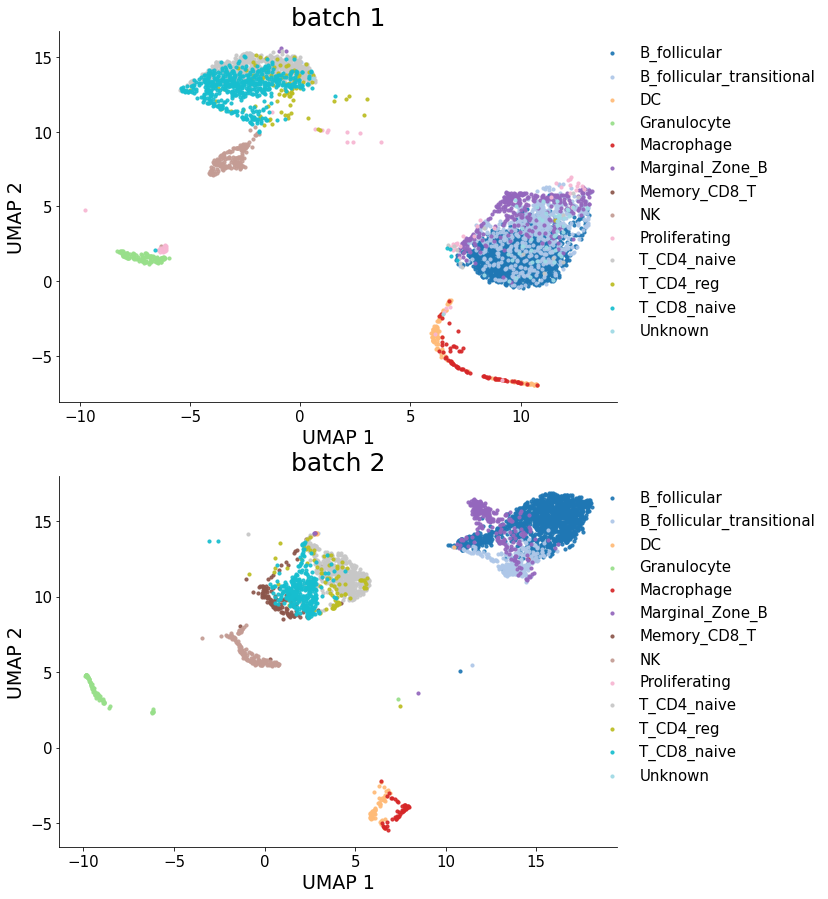

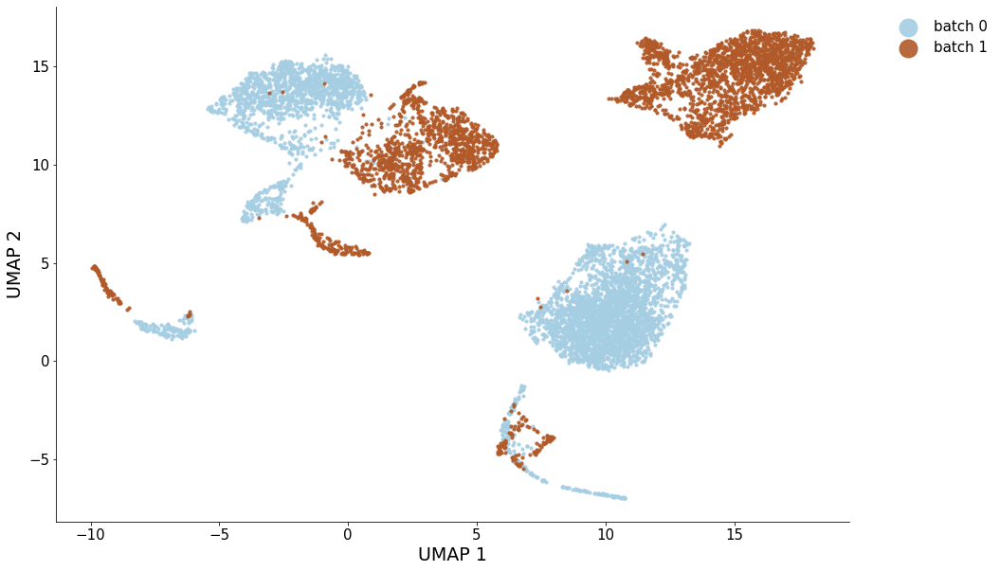

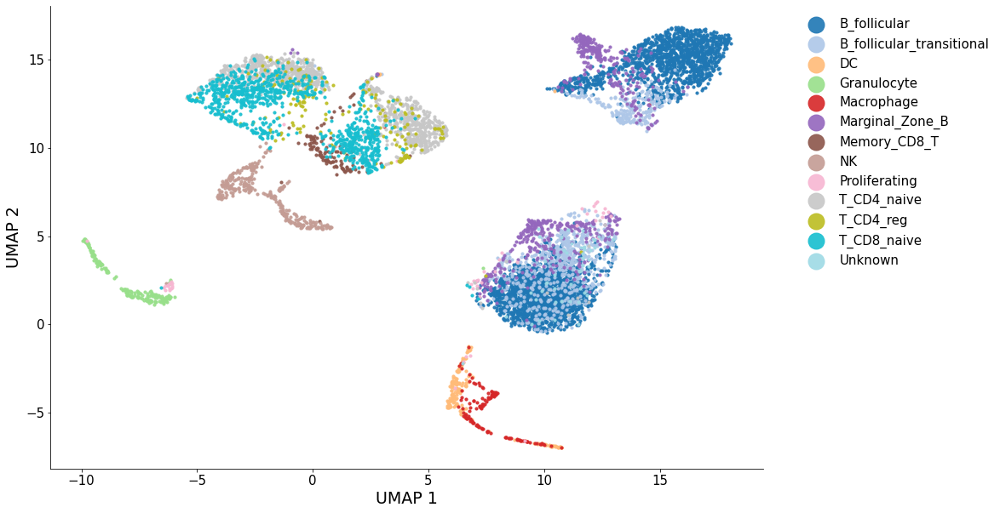

In [15]:
umap_op = UMAP(n_components = 2, n_neighbors = 15, min_dist = 0.4, random_state = 0) 
zs = []
labels = []
prec_labels = []
pre_labels = []
for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    # z = model1.C_cells[batch].cpu().detach().numpy()
    zs.append(z)
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch + 1) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    pre_labels.append(np.argmax(z, axis = 1).squeeze())

x_umap = umap_op.fit_transform(np.concatenate(zs, axis = 0))
# separate into batches
x_umaps = []
for batch in range(0,2):
    if batch == 0:
        start_pointer = 0
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])
    elif batch == 1:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        x_umaps.append(x_umap[start_pointer:,:])
    else:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, figsize = (10,15), axis_label = "UMAP")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)


../src/umap_batch.py:1746: UserWarning: using precomputed metric; transform will be unavailable for new data and inverse_transform will be unavailable for all data
  warn(


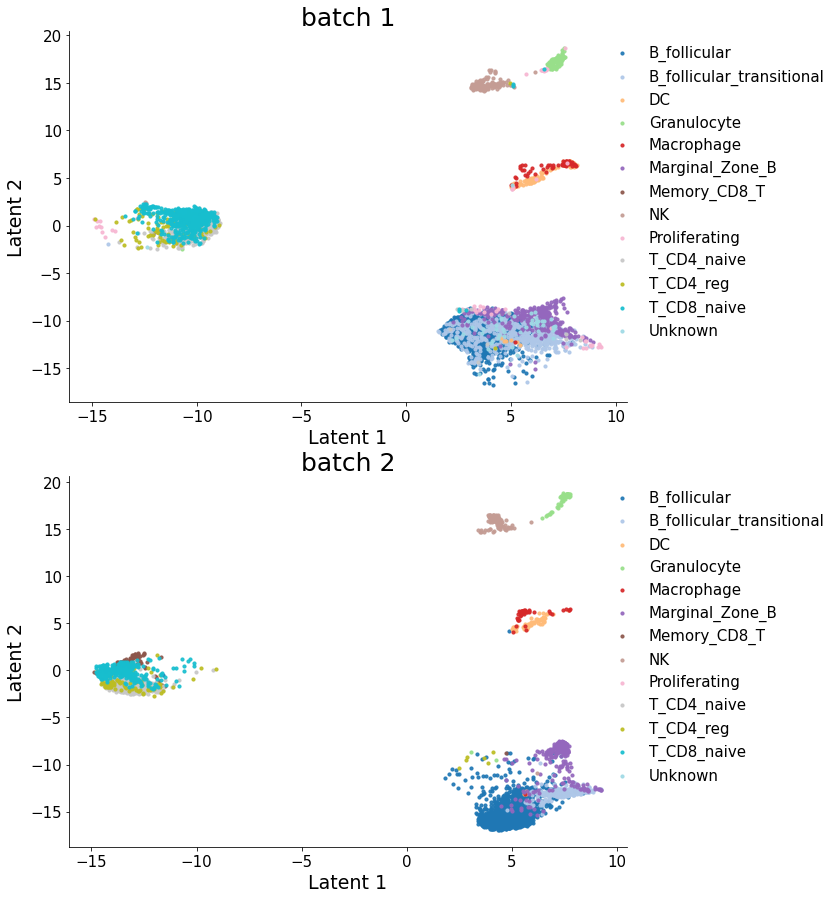

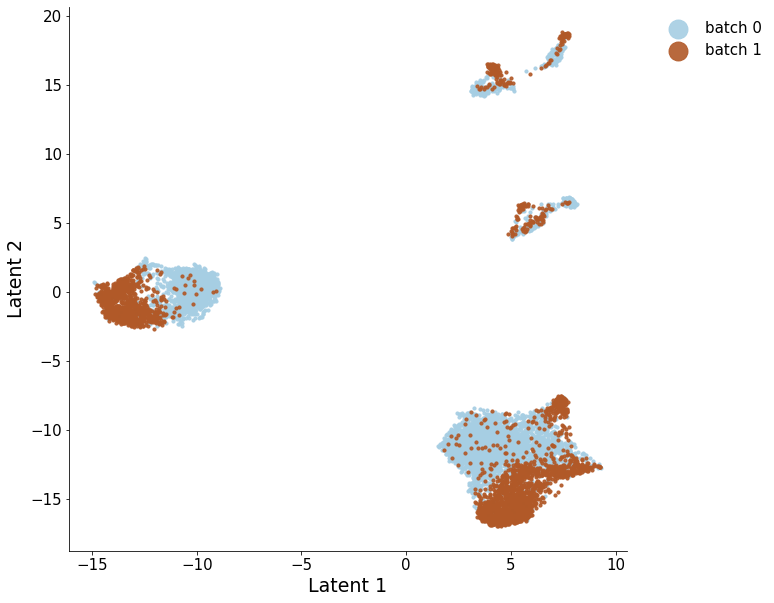

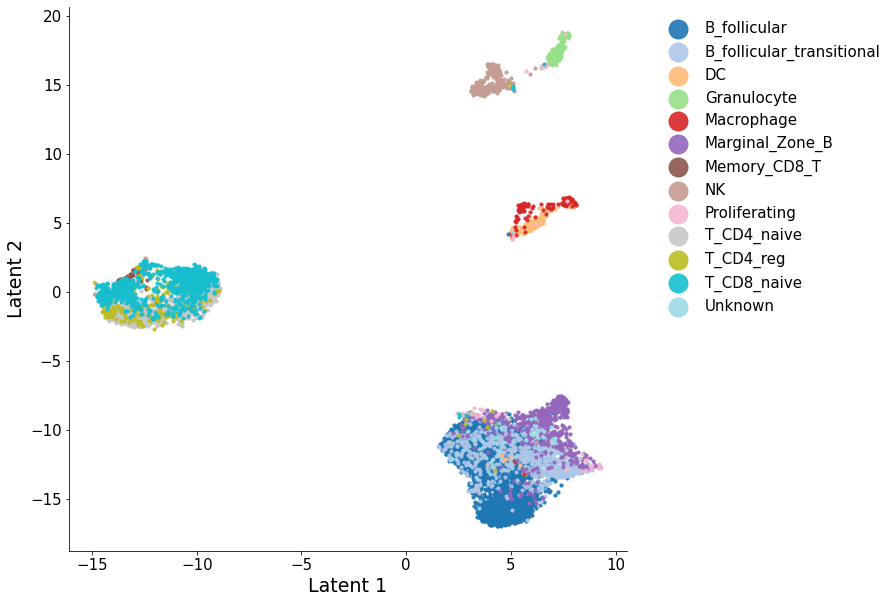

In [16]:
n_neighbors = 10

zs = []
labels = []
prec_labels = []
pre_labels = []
for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    # z = model1.C_cells[batch].cpu().detach().numpy()
    zs.append(z)
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch + 1) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    pre_labels.append(np.argmax(z, axis = 1).squeeze())

s_pair_dist, knn_indices, knn_dists = re_nn_distance(zs, n_neighbors)

umap_op = UMAP(n_components = 2, n_neighbors = n_neighbors, min_dist = 0.4, random_state = 0, 
                metric='precomputed', knn_dists=knn_dists, knn_indices=knn_indices)
x_umap = umap_op.fit_transform(s_pair_dist)
# separate into batches
x_umaps = []
for batch in range(0,2):
    if batch == 0:
        start_pointer = 0
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])
    elif batch == 1:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        x_umaps.append(x_umap[start_pointer:,:])
    else:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, 
                      figsize = (10,15), axis_label = "Latent")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, 
                      figsize = (10,10), axis_label = "Latent", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, 
                      figsize = (10,10), axis_label = "Latent", markerscale = 6)


In [20]:
# read in dataset
dir = '../data/real/diag/Xichen/'

counts_rnas = []
counts_atacs = []
counts_proteins = []
labels = []
for batch in [1, 2]:
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    
    try:
        counts_atac = np.array(sp.load_npz(os.path.join(dir, 'RxC' + str(batch) + ".npz")).todense().T)
        print("ATAC")
        print(counts_atac.shape)
        counts_atac = utils.preprocess(counts_atac, modality = "ATAC")
        print("sparsity: {:.4f}".format(np.sum(counts_atac != 0)/(counts_atac.shape[0] * counts_atac.shape[1])))
        '''
        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_atac)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")
        '''
    except:
        counts_atac = None
        
    try:
        counts_rna = np.array(sp.load_npz(os.path.join(dir, 'GxC' + str(batch) + ".npz")).todense().T)
        print("RNA")
        print(counts_rna.shape)
        print(counts_rna)
        counts_rna = utils.preprocess(counts_rna, modality = "RNA")
        '''
        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_rna)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")
        '''
    except:
        counts_rna = None
    
    # preprocess the count matrix
    counts_rnas.append(counts_rna)
    counts_atacs.append(counts_atac)

counts = {"rna":counts_rnas, "atac": counts_atacs}

A = sp.load_npz(os.path.join(dir, 'GxR.npz'))
A = np.array(A.todense())
# normalize A
A = utils.preprocess(A, modality = "interaction")
interacts = {"rna_atac": A}


# obtain the feature name
genes = pd.read_csv(dir + "genes.txt", header = None).values.squeeze()
regions = pd.read_csv(dir + "regions.txt", header = None).values.squeeze()

feats_name = {"rna": genes, "atac": regions}
counts["feats_name"] = feats_name

# new
counts["rna"][1] = counts["atac"][1] @ interacts["rna_atac"].T
interacts = None

# normalization? 
# quantile
# counts["rna"][1] = quantile_norm(targ_mtx = counts["rna"][1], ref_mtx = counts["rna"][0], replace = True)
counts["rna"][1] = utils.preprocess(counts["rna"][1], modality = "RNA")


RNA
(4382, 2708)
[[1 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 1 0 ... 0 1 0]
 [0 1 0 ... 0 0 0]]
ATAC
(3166, 20435)
sparsity: 0.1534


Input sanity check...
Finished.
Epoch 1000, Validating Loss: 104.2214
	 loss 1: 0.10422
	 loss 2: 0.00059
	 loss 3: 0.00000
Epoch 2000, Validating Loss: 103.4424
	 loss 1: 0.10344
	 loss 2: 0.00304
	 loss 3: 0.00000
Epoch 3000, Validating Loss: 103.0906
	 loss 1: 0.10309
	 loss 2: 0.00425
	 loss 3: 0.00000
Epoch 4000, Validating Loss: 102.8718
	 loss 1: 0.10287
	 loss 2: 0.00327
	 loss 3: 0.00000
Epoch 5000, Validating Loss: 102.7096
	 loss 1: 0.10271
	 loss 2: 0.00321
	 loss 3: 0.00000
Epoch 6000, Validating Loss: 102.5890
	 loss 1: 0.10259
	 loss 2: 0.00366
	 loss 3: 0.00000
running time: 103.71768498420715


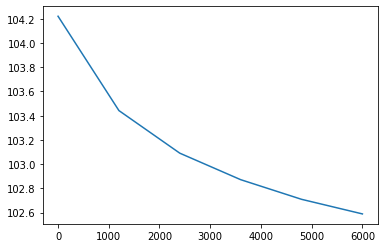

In [22]:
#hyper parameters: best lr = 5e-3, T = 4000, latent_dims = 13
alpha = [1000, 1, 5]
# alpha = [1000, 0, 0]
batchsize = 0.1
run = 0
K = 30
Ns = [K] * 2
N_feat = Ns[0]
interval = 1000
T = 6000
lr = 1e-2

# use interaction matrix
start_time = time.time()
model1 = model.cfrm_vanilla(counts = counts, interacts = interacts, Ns = Ns, K = K, N_feat = N_feat, batch_size = batchsize, interval = interval, lr = lr, alpha = alpha, seed = run).to(device)
losses1 = model1.train_func(T = T)
end_time = time.time()
print("running time: " + str(end_time - start_time))

x = np.linspace(0, T, int(T/interval))
plt.plot(x, losses1)

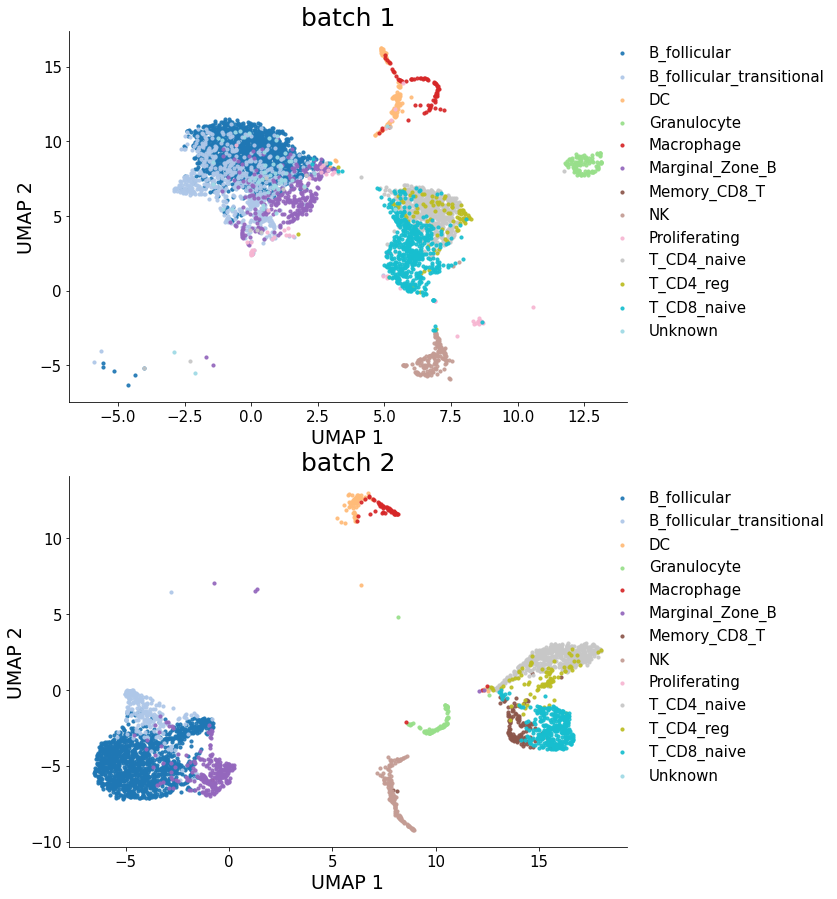

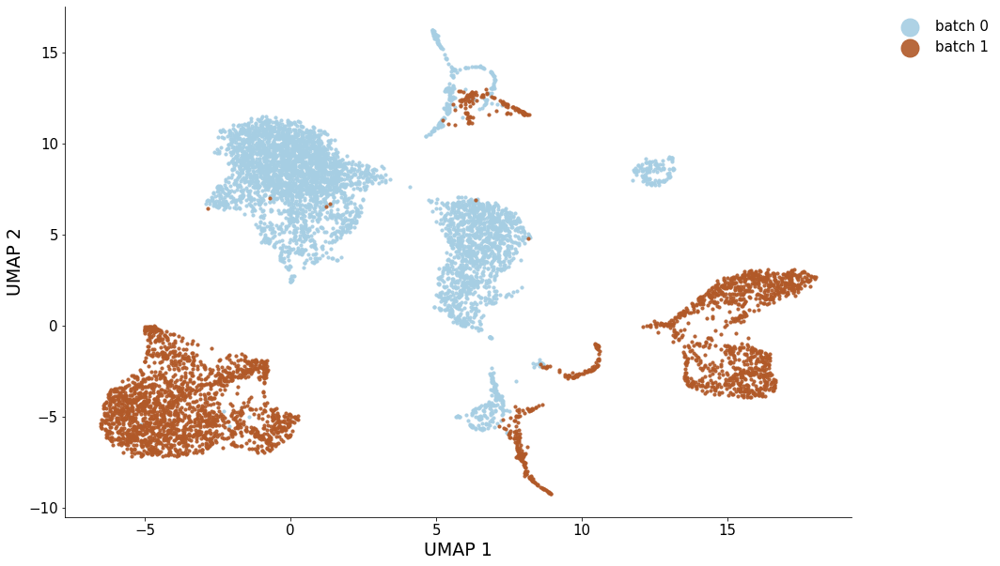

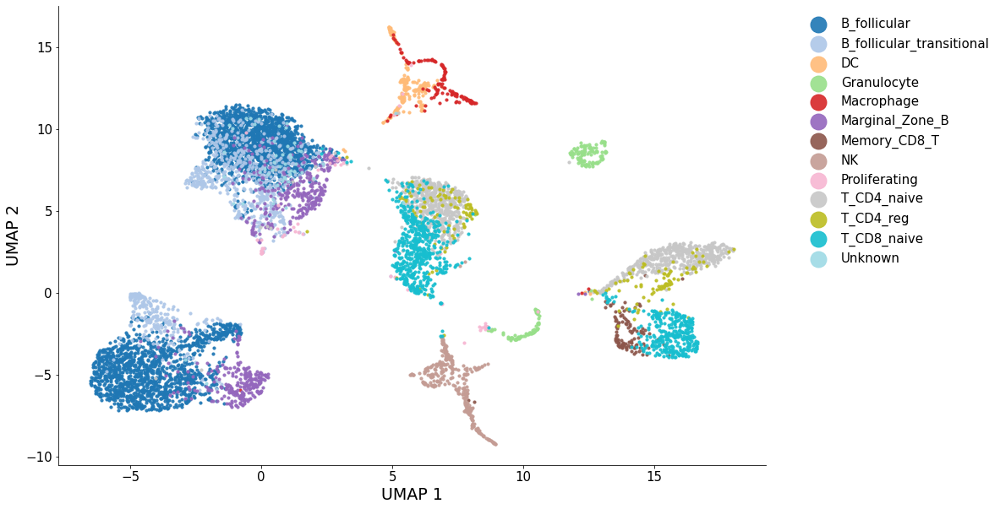

In [23]:
umap_op = UMAP(n_components = 2, n_neighbors = 15, min_dist = 0.4, random_state = 0) 
zs = []
labels = []
prec_labels = []
pre_labels = []
for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    # z = model1.C_cells[batch].cpu().detach().numpy()
    zs.append(z)
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch + 1) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    pre_labels.append(np.argmax(z, axis = 1).squeeze())

x_umap = umap_op.fit_transform(np.concatenate(zs, axis = 0))
# separate into batches
x_umaps = []
for batch in range(0,2):
    if batch == 0:
        start_pointer = 0
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])
    elif batch == 1:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        x_umaps.append(x_umap[start_pointer:,:])
    else:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, figsize = (10,15), axis_label = "UMAP")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)


../src/umap_batch.py:1746: UserWarning: using precomputed metric; transform will be unavailable for new data and inverse_transform will be unavailable for all data
  warn(


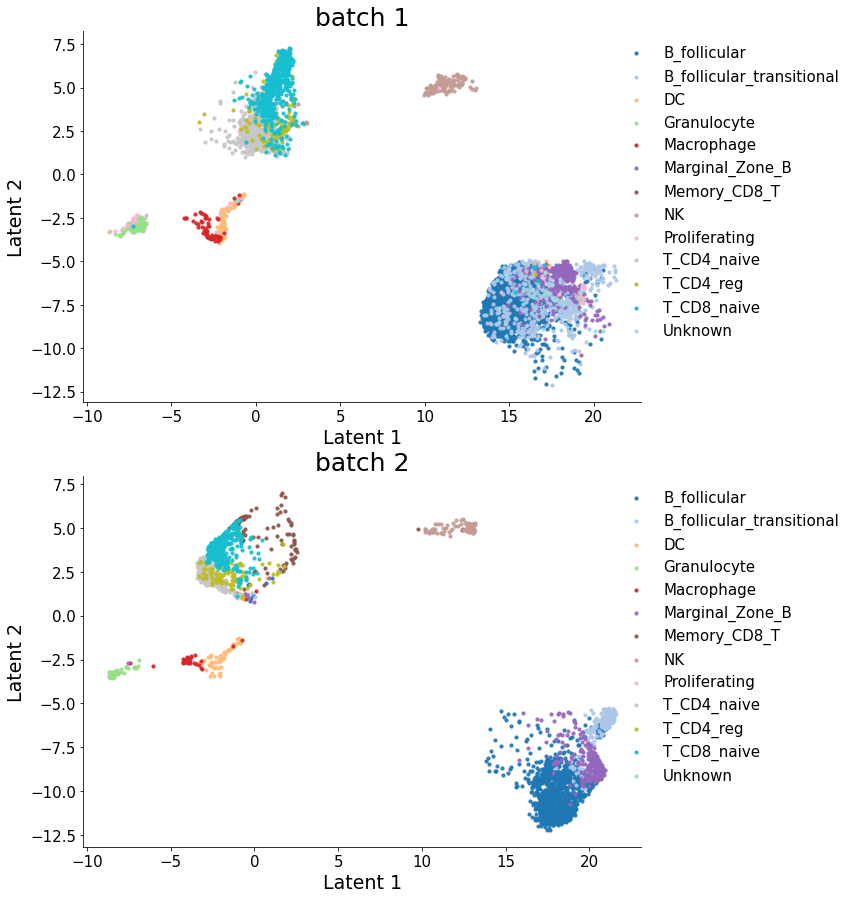

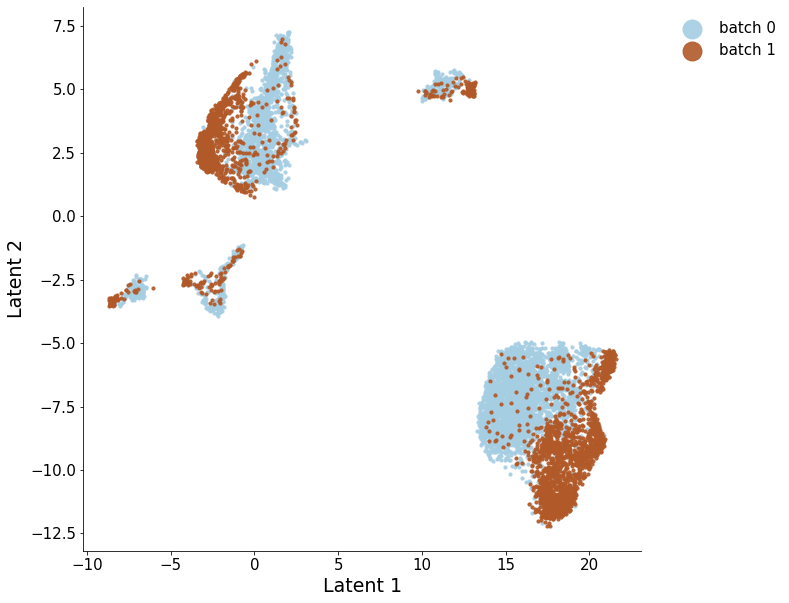

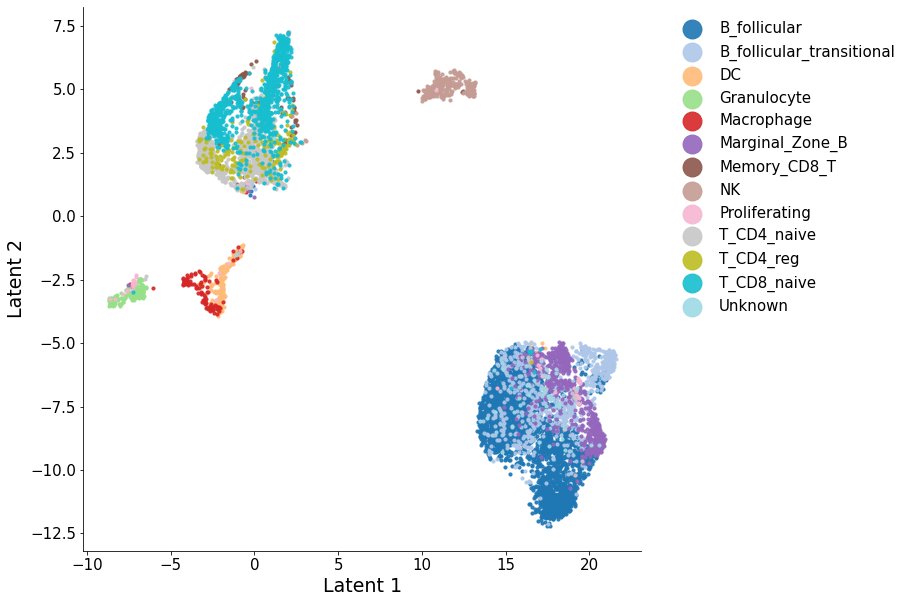

In [24]:
n_neighbors = 10

zs = []
labels = []
prec_labels = []
pre_labels = []
for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    # z = model1.C_cells[batch].cpu().detach().numpy()
    zs.append(z)
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch + 1) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    pre_labels.append(np.argmax(z, axis = 1).squeeze())

s_pair_dist, knn_indices, knn_dists = re_nn_distance(zs, n_neighbors)

umap_op = UMAP(n_components = 2, n_neighbors = n_neighbors, min_dist = 0.4, random_state = 0, 
                metric='precomputed', knn_dists=knn_dists, knn_indices=knn_indices)
x_umap = umap_op.fit_transform(s_pair_dist)
# separate into batches
x_umaps = []
for batch in range(0,2):
    if batch == 0:
        start_pointer = 0
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])
    elif batch == 1:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        x_umaps.append(x_umap[start_pointer:,:])
    else:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, 
                      figsize = (10,15), axis_label = "Latent")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, 
                      figsize = (10,10), axis_label = "Latent", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, 
                      figsize = (10,10), axis_label = "Latent", markerscale = 6)


## BMMC

In [25]:
# read in dataset
dir = '../data/real/diag/BMMC/small_ver/'

counts_rnas = []
counts_atacs = []
counts_proteins = []
labels = []
for batch in [1, 2]:
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    
    try:
        counts_atac = np.array(sp.load_npz(os.path.join(dir, 'RxC' + str(batch) + ".npz")).todense().T)
        print("ATAC")
        print(counts_atac.shape)
        counts_atac = utils.preprocess(counts_atac, modality = "ATAC")
        print("sparsity: {:.4f}".format(np.sum(counts_atac != 0)/(counts_atac.shape[0] * counts_atac.shape[1])))
        '''
        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_atac)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")
        '''
    except:
        counts_atac = None
        
    try:
        counts_rna = np.array(sp.load_npz(os.path.join(dir, 'GxC' + str(batch) + ".npz")).todense().T)
        print("RNA")
        print(counts_rna.shape)
        print(counts_rna)
        counts_rna = utils.preprocess(counts_rna, modality = "RNA")
        '''
        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_rna)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")
        '''
    except:
        counts_rna = None
    
    # preprocess the count matrix
    counts_rnas.append(counts_rna)
    counts_atacs.append(counts_atac)

counts = {"rna":counts_rnas, "atac": counts_atacs}

A = sp.load_npz(os.path.join(dir, 'GxR.npz'))
A = np.array(A.todense())
# normalize A
A = utils.preprocess(A, modality = "interaction")
interacts = {"rna_atac": A}

# obtain the feature name
genes = pd.read_csv(dir + "genes.txt", header = None).values.squeeze()
regions = pd.read_csv(dir + "regions.txt", header = None).values.squeeze()

feats_name = {"rna": genes, "atac": regions}
counts["feats_name"] = feats_name


# new
counts["rna"][1] = counts["atac"][1] @ interacts["rna_atac"].T
interacts = None

# normalization? 
# quantile
# counts["rna"][1] = quantile_norm(targ_mtx = counts["rna"][1], ref_mtx = counts["rna"][0], replace = True)
counts["rna"][1] = utils.preprocess(counts["rna"][1], modality = "RNA")

RNA
(12382, 908)
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 3. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 4. 0. ... 0. 0. 0.]]
ATAC
(16176, 20002)
sparsity: 0.0178


Input sanity check...
Finished.
Epoch 1000, Validating Loss: 26.0609
	 loss 1: 0.02606
	 loss 2: 0.00138
	 loss 3: 0.00000
Epoch 2000, Validating Loss: 25.5469
	 loss 1: 0.02554
	 loss 2: 0.00336
	 loss 3: 0.00000
Epoch 3000, Validating Loss: 25.3288
	 loss 1: 0.02532
	 loss 2: 0.00412
	 loss 3: 0.00000
Epoch 4000, Validating Loss: 25.2174
	 loss 1: 0.02521
	 loss 2: 0.00335
	 loss 3: 0.00000
Epoch 5000, Validating Loss: 25.1427
	 loss 1: 0.02514
	 loss 2: 0.00253
	 loss 3: 0.00000
Epoch 6000, Validating Loss: 25.0874
	 loss 1: 0.02508
	 loss 2: 0.00375
	 loss 3: 0.00000
running time: 129.20818161964417


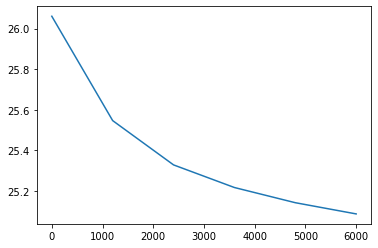

In [26]:
#hyper parameters: best lr = 5e-3, T = 4000, latent_dims = 13
alpha = [1000, 1, 5]
# alpha = [1000, 0, 0]
batchsize = 0.1
run = 0
K = 30
Ns = [K] * 2
N_feat = Ns[0]
interval = 1000
T = 6000
lr = 1e-2

# use interaction matrix
start_time = time.time()
model1 = model.cfrm_vanilla(counts = counts, interacts = interacts, Ns = Ns, K = K, N_feat = N_feat, batch_size = batchsize, interval = interval, lr = lr, alpha = alpha, seed = run).to(device)
losses1 = model1.train_func(T = T)
end_time = time.time()
print("running time: " + str(end_time - start_time))

x = np.linspace(0, T, int(T/interval))
plt.plot(x, losses1)

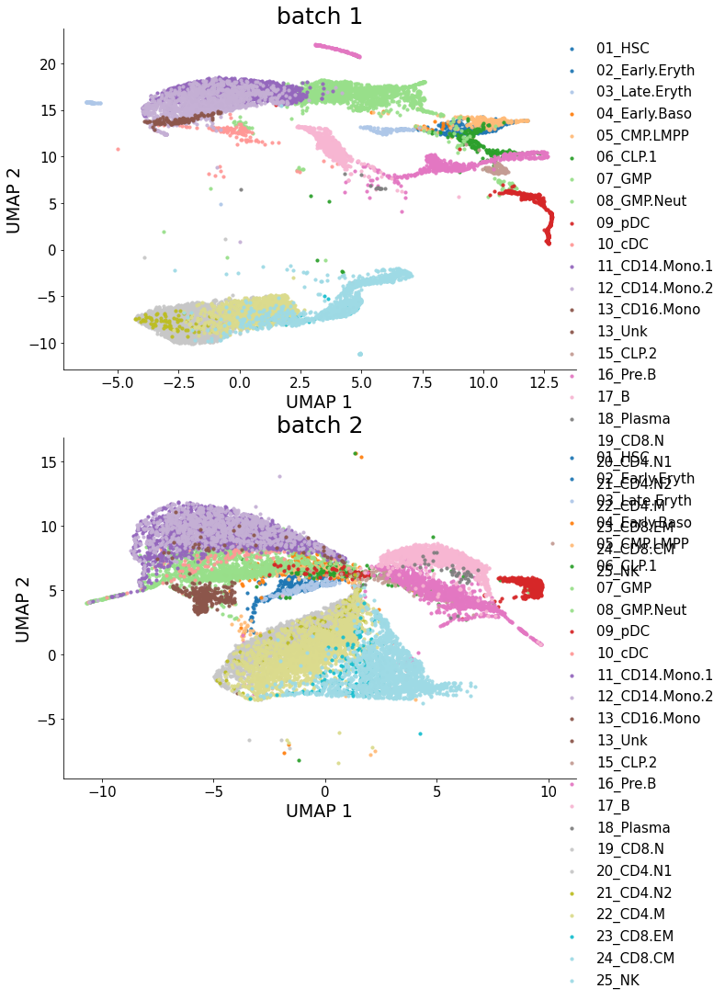

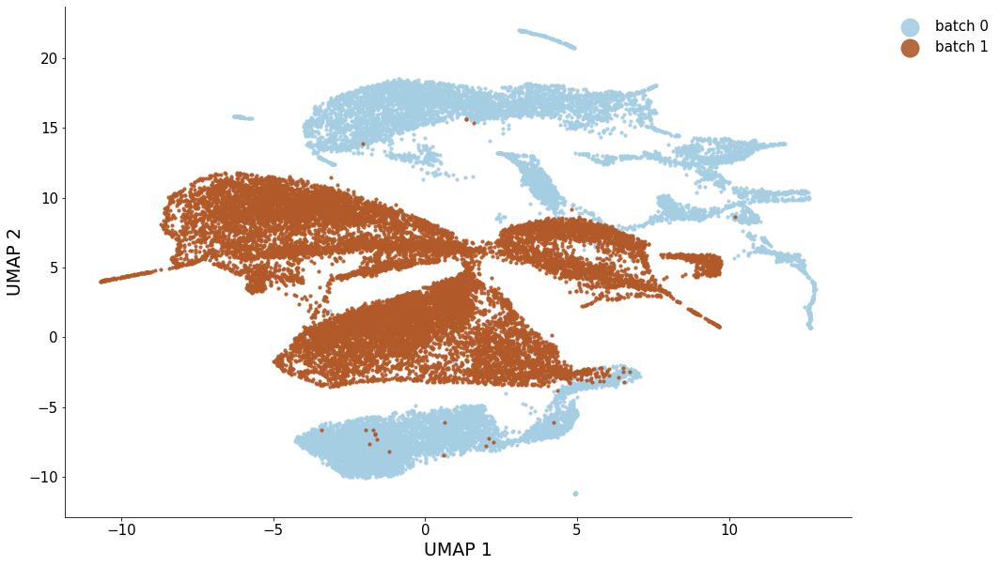

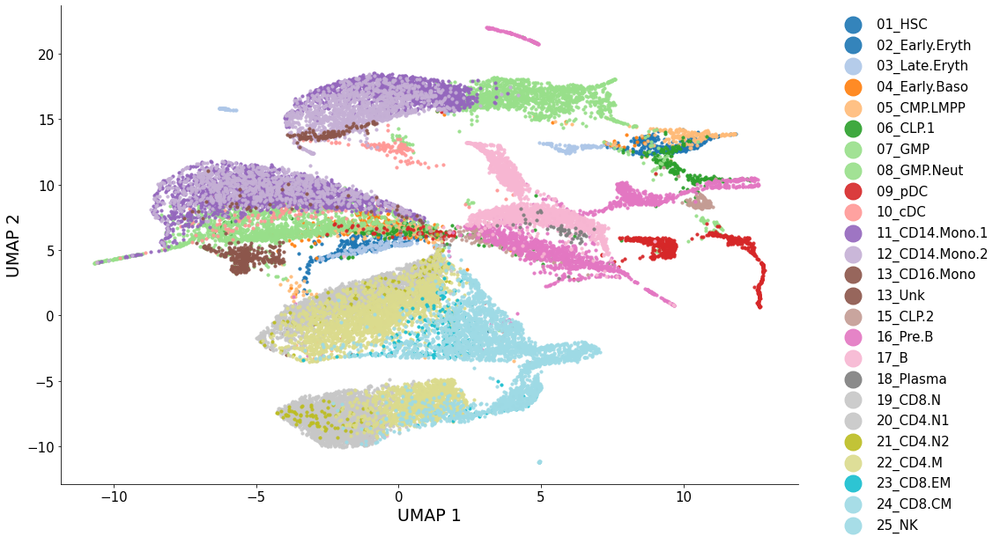

In [27]:
umap_op = UMAP(n_components = 2, n_neighbors = 15, min_dist = 0.4, random_state = 0) 
zs = []
labels = []
prec_labels = []
pre_labels = []
for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    # z = model1.C_cells[batch].cpu().detach().numpy()
    zs.append(z)
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch + 1) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    pre_labels.append(np.argmax(z, axis = 1).squeeze())

x_umap = umap_op.fit_transform(np.concatenate(zs, axis = 0))
# separate into batches
x_umaps = []
for batch in range(0,2):
    if batch == 0:
        start_pointer = 0
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])
    elif batch == 1:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        x_umaps.append(x_umap[start_pointer:,:])
    else:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, figsize = (10,15), axis_label = "UMAP")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)


../src/umap_batch.py:1746: UserWarning: using precomputed metric; transform will be unavailable for new data and inverse_transform will be unavailable for all data
  warn(


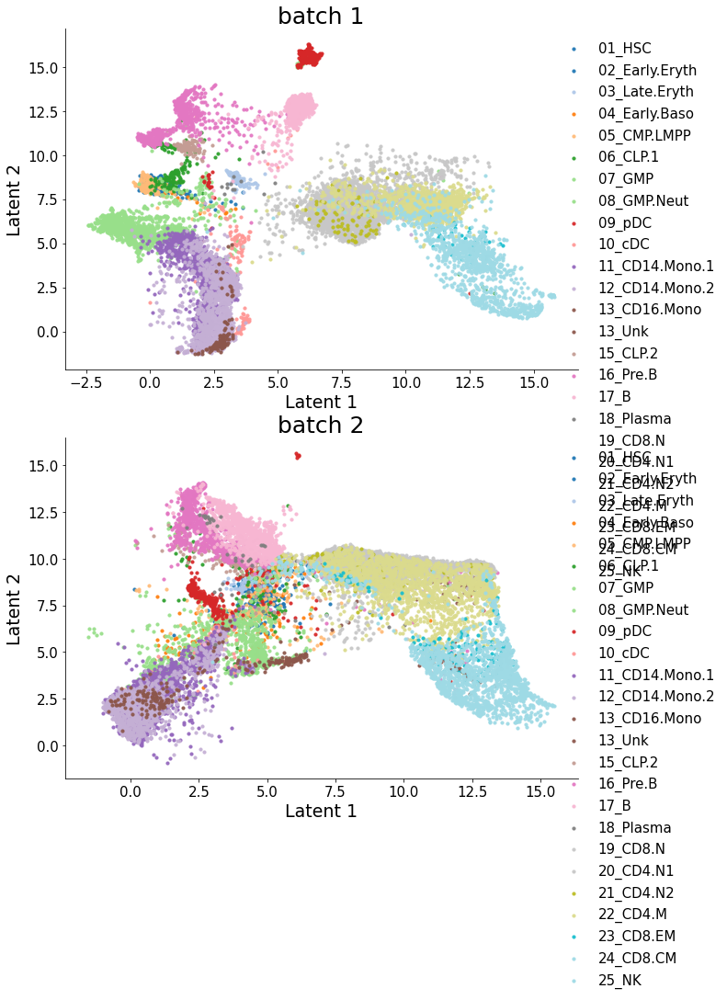

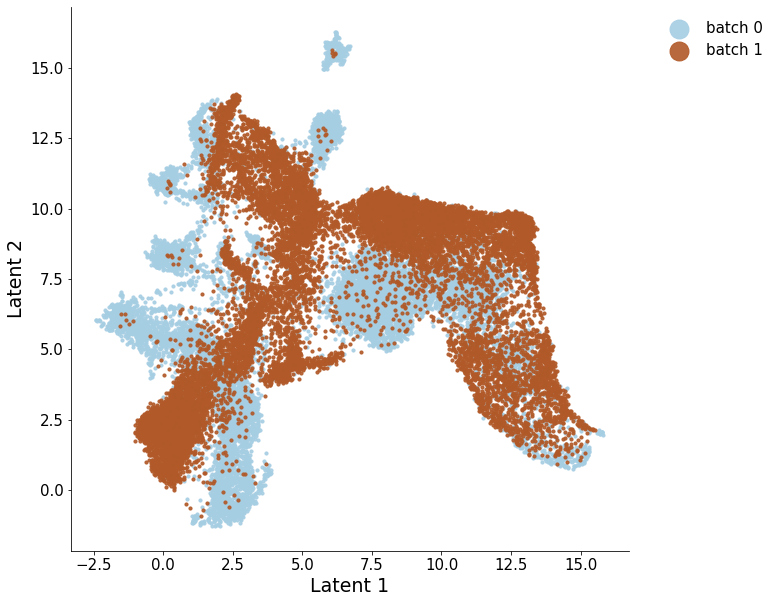

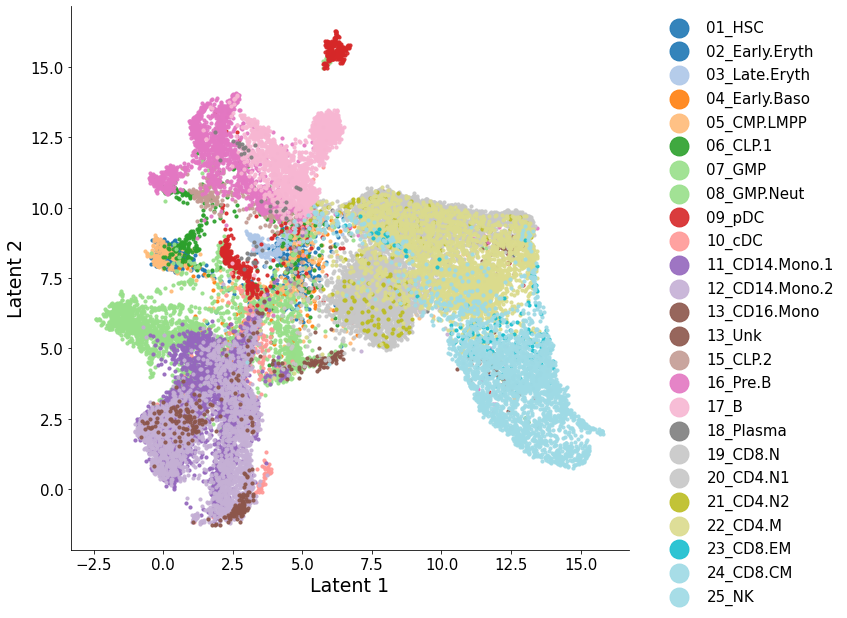

In [28]:
n_neighbors = 10

zs = []
labels = []
prec_labels = []
pre_labels = []
for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    # z = model1.C_cells[batch].cpu().detach().numpy()
    zs.append(z)
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch + 1) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    pre_labels.append(np.argmax(z, axis = 1).squeeze())

s_pair_dist, knn_indices, knn_dists = re_nn_distance(zs, n_neighbors)

umap_op = UMAP(n_components = 2, n_neighbors = n_neighbors, min_dist = 0.4, random_state = 0, 
                metric='precomputed', knn_dists=knn_dists, knn_indices=knn_indices)
x_umap = umap_op.fit_transform(s_pair_dist)
# separate into batches
x_umaps = []
for batch in range(0,2):
    if batch == 0:
        start_pointer = 0
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])
    elif batch == 1:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        x_umaps.append(x_umap[start_pointer:,:])
    else:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, 
                      figsize = (10,15), axis_label = "Latent")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, 
                      figsize = (10,10), axis_label = "Latent", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, 
                      figsize = (10,10), axis_label = "Latent", markerscale = 6)


RNA
(12382, 908)
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 3. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 4. 0. ... 0. 0. 0.]]
ATAC
(16176, 20002)
sparsity: 0.0178


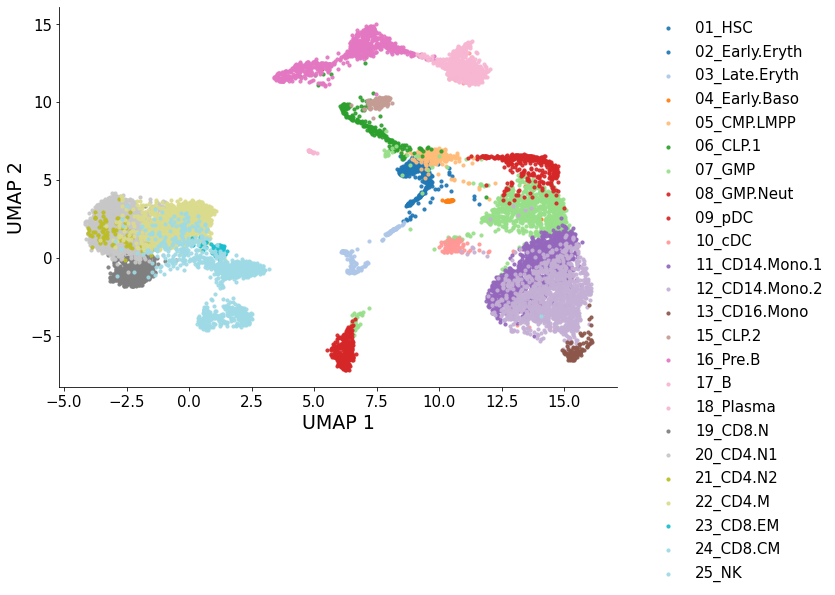

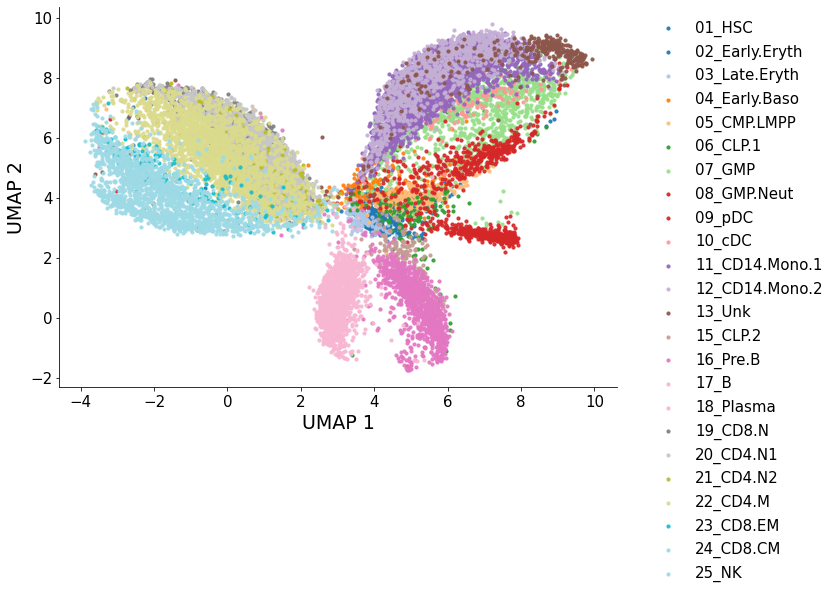

In [3]:
# read in dataset
dir = '../data/real/diag/BMMC/small_ver/'

counts_rnas = []
counts_atacs = []
counts_proteins = []
labels = []
for batch in [1, 2]:
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    
    try:
        counts_atac = np.array(sp.load_npz(os.path.join(dir, 'RxC' + str(batch) + ".npz")).todense().T)
        print("ATAC")
        print(counts_atac.shape)
        counts_atac = utils.preprocess(counts_atac, modality = "ATAC")
        print("sparsity: {:.4f}".format(np.sum(counts_atac != 0)/(counts_atac.shape[0] * counts_atac.shape[1])))
        '''
        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_atac)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")
        '''
    except:
        counts_atac = None
        
    try:
        counts_rna = np.array(sp.load_npz(os.path.join(dir, 'GxC' + str(batch) + ".npz")).todense().T)
        print("RNA")
        print(counts_rna.shape)
        print(counts_rna)
        counts_rna = utils.preprocess(counts_rna, modality = "RNA")
        '''
        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_rna)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")
        '''
    except:
        counts_rna = None
    
    # preprocess the count matrix
    counts_rnas.append(counts_rna)
    counts_atacs.append(counts_atac)

counts = {"rna":counts_rnas, "atac": counts_atacs}

A = sp.load_npz(os.path.join(dir, 'GxR.npz'))
A = np.array(A.todense())
# normalize A
A = utils.preprocess(A, modality = "interaction")
interacts = {"rna_atac": A}

# obtain the feature name
genes = pd.read_csv(dir + "genes.txt", header = None).values.squeeze()
regions = pd.read_csv(dir + "regions.txt", header = None).values.squeeze()

feats_name = {"rna": genes, "atac": regions}
counts["feats_name"] = feats_name


# new
counts["rna"][1] = counts["atac"][1] @ interacts["rna_atac"].T
interacts = None

Input sanity check...
Finished.
Epoch 1000, Validating Loss: 24.5555
	 loss 1: 0.02455
	 loss 2: 0.00138
	 loss 3: 0.00000
Epoch 2000, Validating Loss: 24.0171
	 loss 1: 0.02401
	 loss 2: 0.00336
	 loss 3: 0.00000
Epoch 3000, Validating Loss: 23.8108
	 loss 1: 0.02381
	 loss 2: 0.00412
	 loss 3: 0.00000
Epoch 4000, Validating Loss: 23.7004
	 loss 1: 0.02370
	 loss 2: 0.00335
	 loss 3: 0.00000
Epoch 5000, Validating Loss: 23.6238
	 loss 1: 0.02362
	 loss 2: 0.00253
	 loss 3: 0.00000
Epoch 6000, Validating Loss: 23.5707
	 loss 1: 0.02357
	 loss 2: 0.00375
	 loss 3: 0.00000
running time: 124.96080040931702


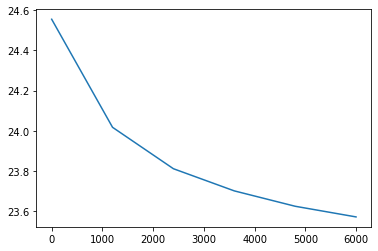

In [5]:
#hyper parameters: best lr = 5e-3, T = 4000, latent_dims = 13
alpha = [1000, 1, 5]
# alpha = [1000, 0, 0]
batchsize = 0.1
run = 0
K = 30
Ns = [K] * 2
N_feat = Ns[0]
interval = 1000
T = 6000
lr = 1e-2

# use interaction matrix
start_time = time.time()
model1 = model.cfrm_vanilla(counts = counts, interacts = interacts, Ns = Ns, K = K, N_feat = N_feat, batch_size = batchsize, interval = interval, lr = lr, alpha = alpha, seed = run).to(device)
losses1 = model1.train_func(T = T)
end_time = time.time()
print("running time: " + str(end_time - start_time))

x = np.linspace(0, T, int(T/interval))
plt.plot(x, losses1)

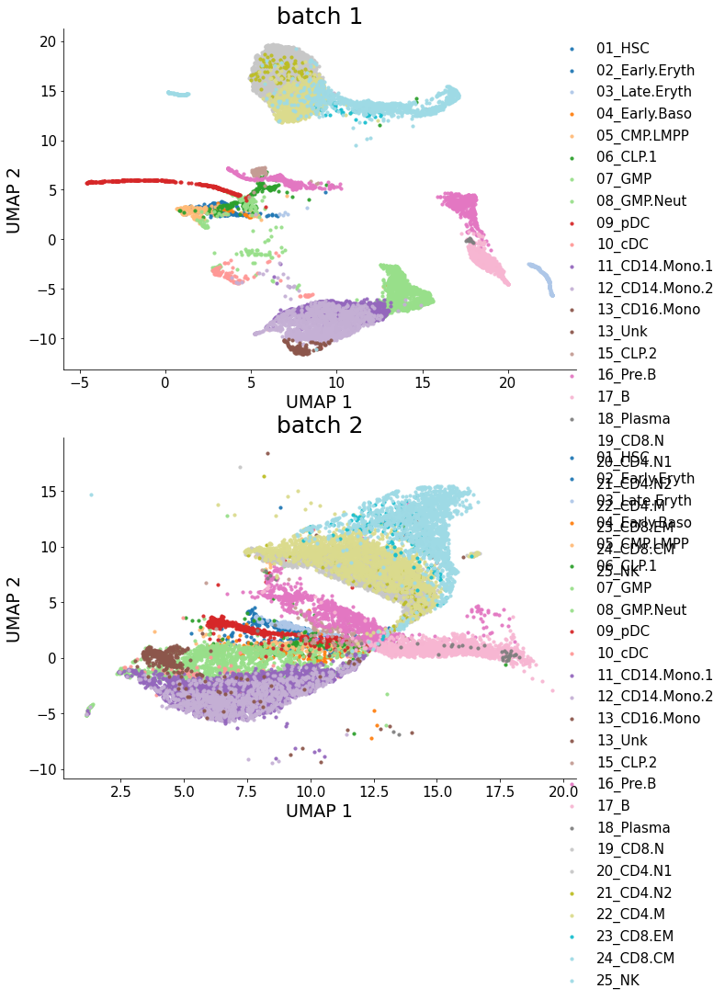

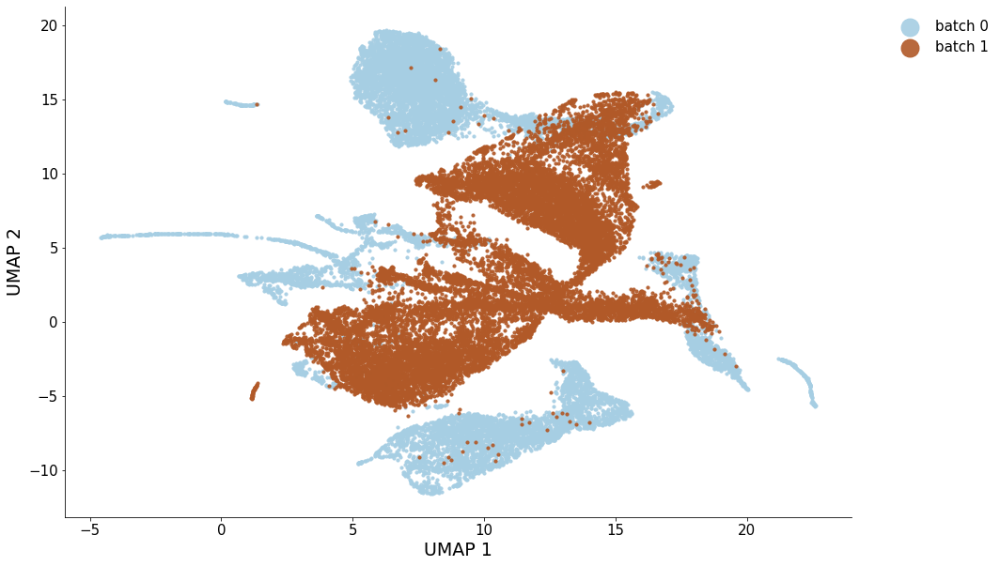

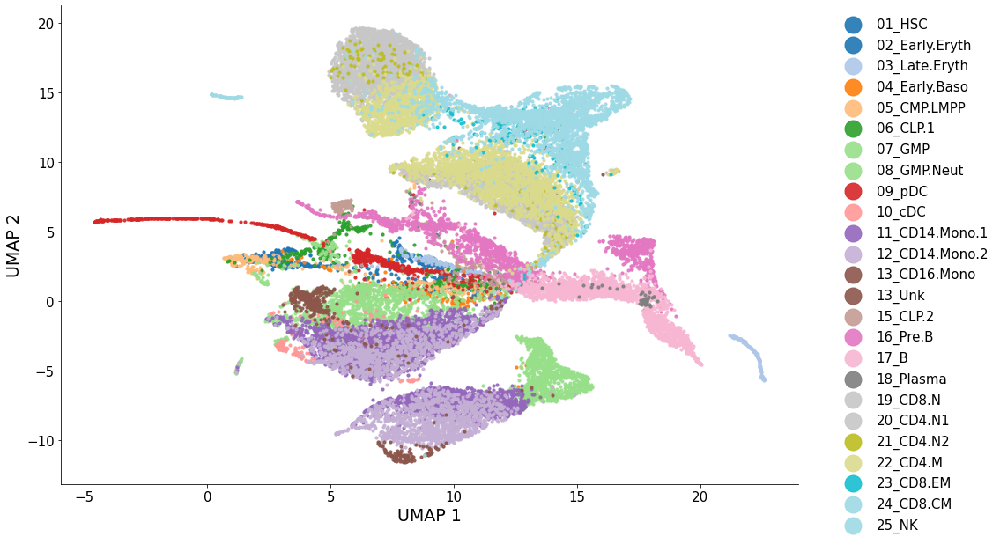

In [6]:
umap_op = UMAP(n_components = 2, n_neighbors = 15, min_dist = 0.4, random_state = 0) 
zs = []
labels = []
prec_labels = []
pre_labels = []
for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    # z = model1.C_cells[batch].cpu().detach().numpy()
    zs.append(z)
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch + 1) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    pre_labels.append(np.argmax(z, axis = 1).squeeze())

x_umap = umap_op.fit_transform(np.concatenate(zs, axis = 0))
# separate into batches
x_umaps = []
for batch in range(0,2):
    if batch == 0:
        start_pointer = 0
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])
    elif batch == 1:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        x_umaps.append(x_umap[start_pointer:,:])
    else:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, figsize = (10,15), axis_label = "UMAP")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)


../src/umap_batch.py:1746: UserWarning: using precomputed metric; transform will be unavailable for new data and inverse_transform will be unavailable for all data
  warn(


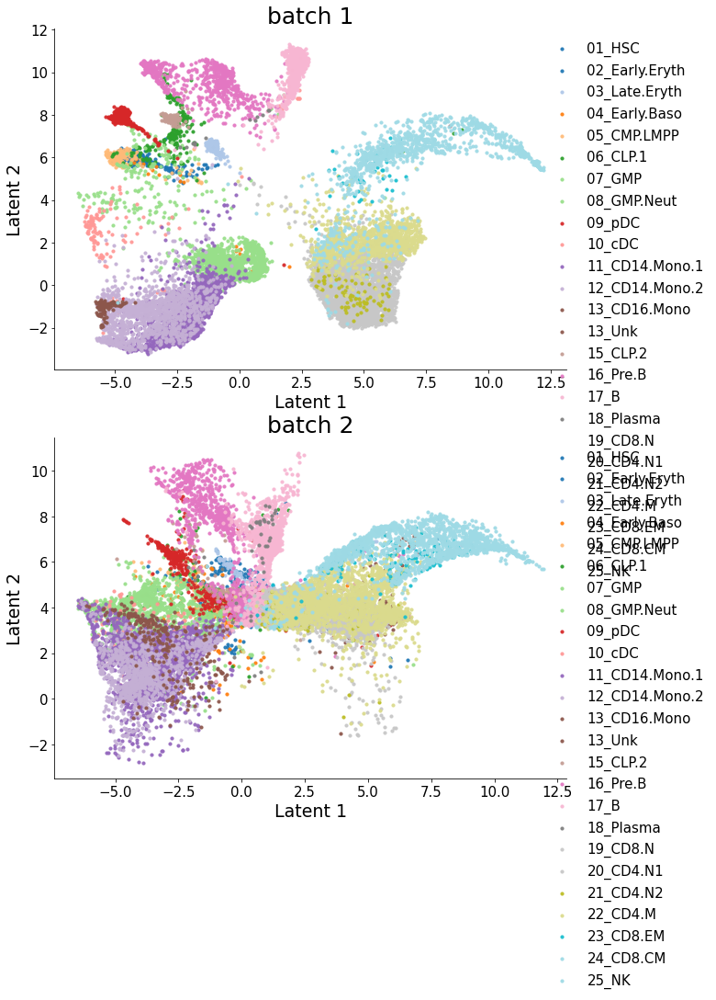

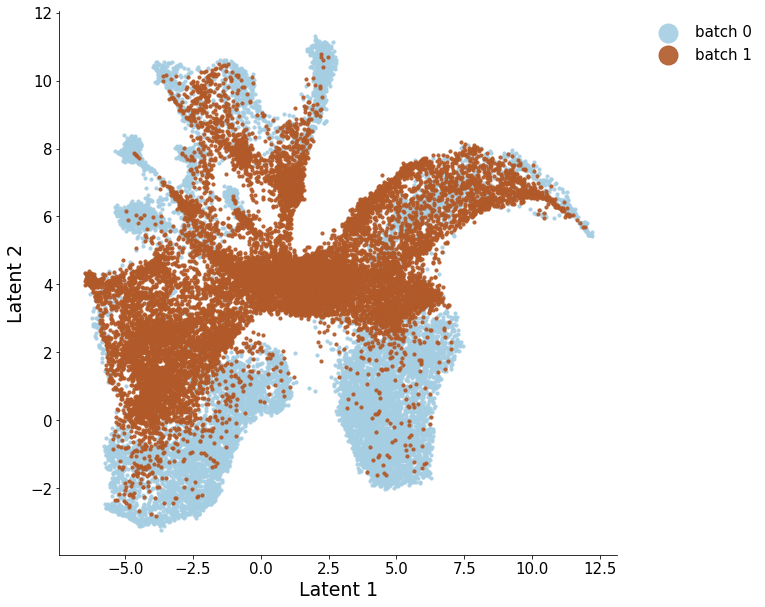

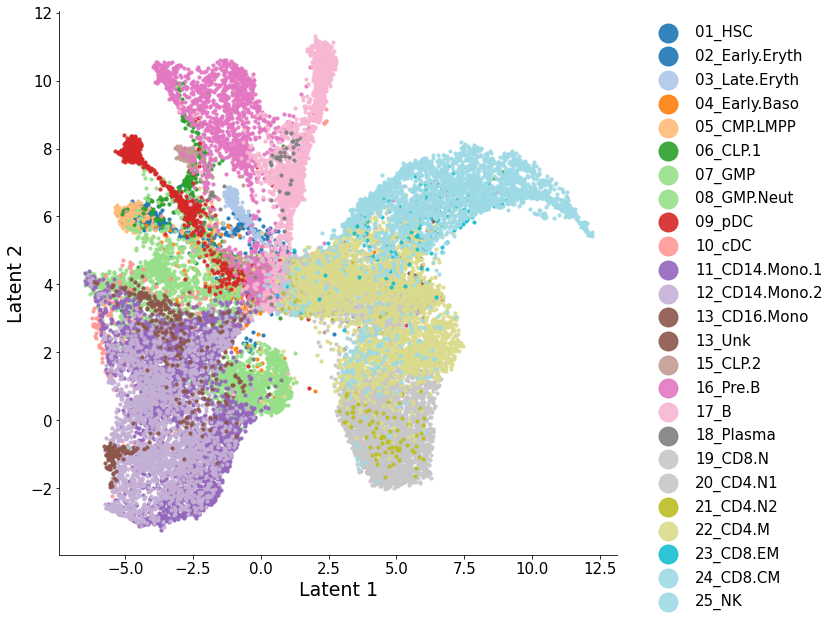

In [7]:
n_neighbors = 10

zs = []
labels = []
prec_labels = []
pre_labels = []
for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    # z = model1.C_cells[batch].cpu().detach().numpy()
    zs.append(z)
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch + 1) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    pre_labels.append(np.argmax(z, axis = 1).squeeze())

s_pair_dist, knn_indices, knn_dists = re_nn_distance(zs, n_neighbors)

umap_op = UMAP(n_components = 2, n_neighbors = n_neighbors, min_dist = 0.4, random_state = 0, 
                metric='precomputed', knn_dists=knn_dists, knn_indices=knn_indices)
x_umap = umap_op.fit_transform(s_pair_dist)
# separate into batches
x_umaps = []
for batch in range(0,2):
    if batch == 0:
        start_pointer = 0
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])
    elif batch == 1:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        x_umaps.append(x_umap[start_pointer:,:])
    else:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, 
                      figsize = (10,15), axis_label = "Latent")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, 
                      figsize = (10,10), axis_label = "Latent", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, 
                      figsize = (10,10), axis_label = "Latent", markerscale = 6)


## Endo

RNA
(1628, 1789)
[[0 0 0 ... 0 8 0]
 [0 0 0 ... 0 3 0]
 [0 1 1 ... 0 0 0]
 ...
 [0 0 4 ... 1 0 0]
 [0 0 5 ... 0 8 0]
 [0 0 1 ... 0 1 0]]
ATAC
(1186, 13955)
sparsity: 0.1174


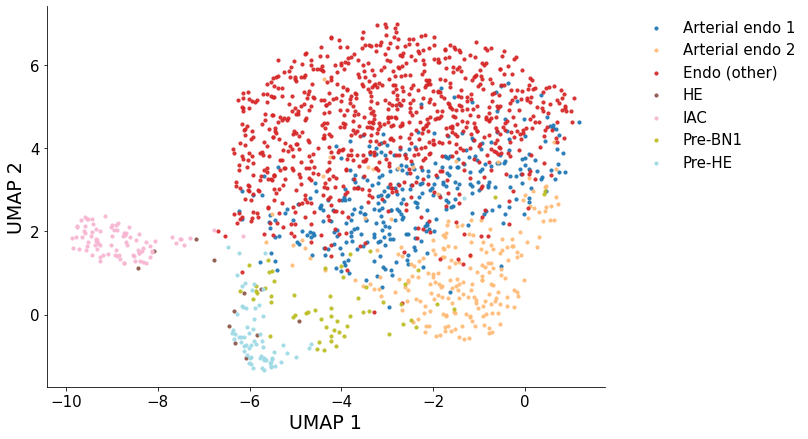

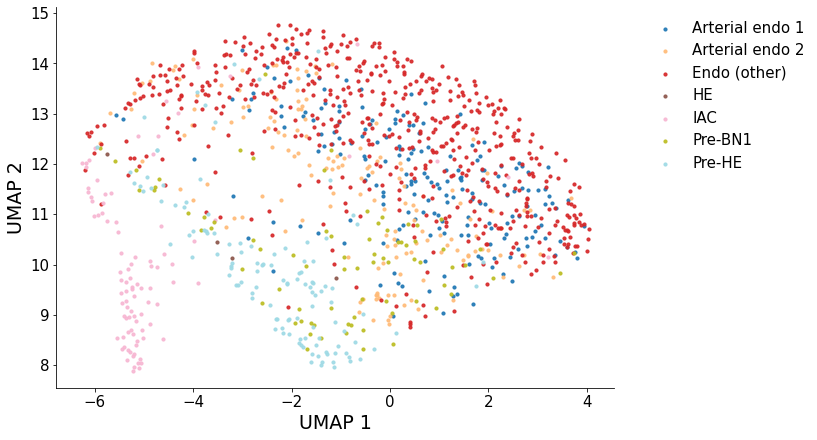

In [60]:
# read in dataset
dir = '../data/real/diag/Endo/'

counts_rnas = []
counts_atacs = []
counts_proteins = []
labels = []
for batch in [1, 2]:
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    
    try:
        counts_atac = np.array(sp.load_npz(os.path.join(dir, 'RxC' + str(batch) + ".npz")).todense().T)
        print("ATAC")
        print(counts_atac.shape)
        counts_atac = utils.preprocess(counts_atac, modality = "ATAC")
        print("sparsity: {:.4f}".format(np.sum(counts_atac != 0)/(counts_atac.shape[0] * counts_atac.shape[1])))
        
        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_atac)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")
        
    except:
        counts_atac = None
        
    try:
        counts_rna = np.array(sp.load_npz(os.path.join(dir, 'GxC' + str(batch) + ".npz")).todense().T)
        print("RNA")
        print(counts_rna.shape)
        print(counts_rna)
        counts_rna = utils.preprocess(counts_rna, modality = "RNA")

        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_rna)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")

    except:
        counts_rna = None
    
    # preprocess the count matrix
    counts_rnas.append(counts_rna)
    counts_atacs.append(counts_atac)

counts = {"rna":counts_rnas, "atac": counts_atacs}

A = sp.load_npz(os.path.join(dir, 'GxR.npz'))
A = np.array(A.todense())
# normalize A
A = utils.preprocess(A, modality = "interaction")
interacts = {"rna_atac": A}


# obtain the feature name
genes = pd.read_csv(dir + "genes.txt", header = None).values.squeeze()
regions = pd.read_csv(dir + "regions.txt", header = None).values.squeeze()

feats_name = {"rna": genes, "atac": regions}
counts["feats_name"] = feats_name

Input sanity check...
Finished.
Epoch 1000, Validating Loss: 91.4491
	 loss 1: 0.09145
	 loss 2: 597.99915
	 loss 3: -0.38423
Epoch 2000, Validating Loss: 89.8720
	 loss 1: 0.08987
	 loss 2: 597.99915
	 loss 3: -0.35013
Epoch 3000, Validating Loss: 89.3697
	 loss 1: 0.08937
	 loss 2: 597.99915
	 loss 3: -0.34283
Epoch 4000, Validating Loss: 89.1335
	 loss 1: 0.08913
	 loss 2: 597.99915
	 loss 3: -0.33786
Epoch 5000, Validating Loss: 88.9940
	 loss 1: 0.08899
	 loss 2: 597.99915
	 loss 3: -0.33299
Epoch 6000, Validating Loss: 88.9357
	 loss 1: 0.08894
	 loss 2: 597.99915
	 loss 3: -0.32931
running time: 85.06055521965027


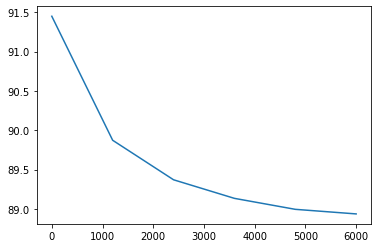

In [43]:
#hyper parameters: best lr = 5e-3, T = 4000, latent_dims = 13
# alpha = [1000, 1, 5]
alpha = [1000, 0, 0]
batchsize = 0.1
run = 0
K = 30
Ns = [K] * 2
N_feat = Ns[0]
interval = 1000
T = 6000
lr = 1e-2

# use interaction matrix
start_time = time.time()
model1 = model.cfrm_vanilla(counts = counts, interacts = interacts, Ns = Ns, K = K, N_feat = N_feat, batch_size = batchsize, interval = interval, lr = lr, alpha = alpha, seed = run).to(device)
losses1 = model1.train_func(T = T)
end_time = time.time()
print("running time: " + str(end_time - start_time))

x = np.linspace(0, T, int(T/interval))
plt.plot(x, losses1)

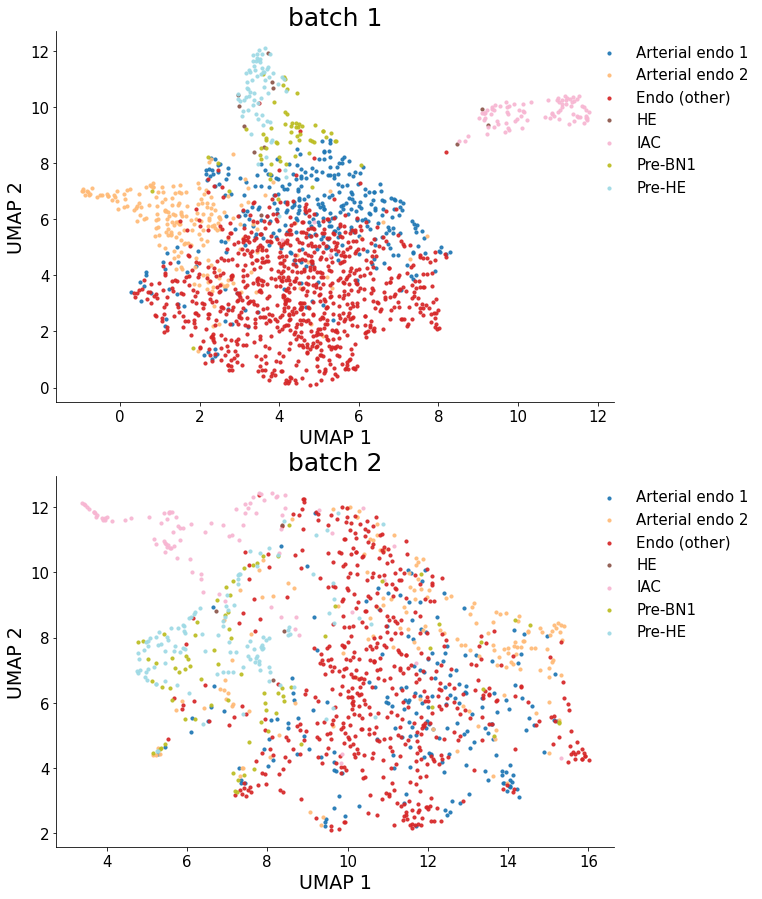

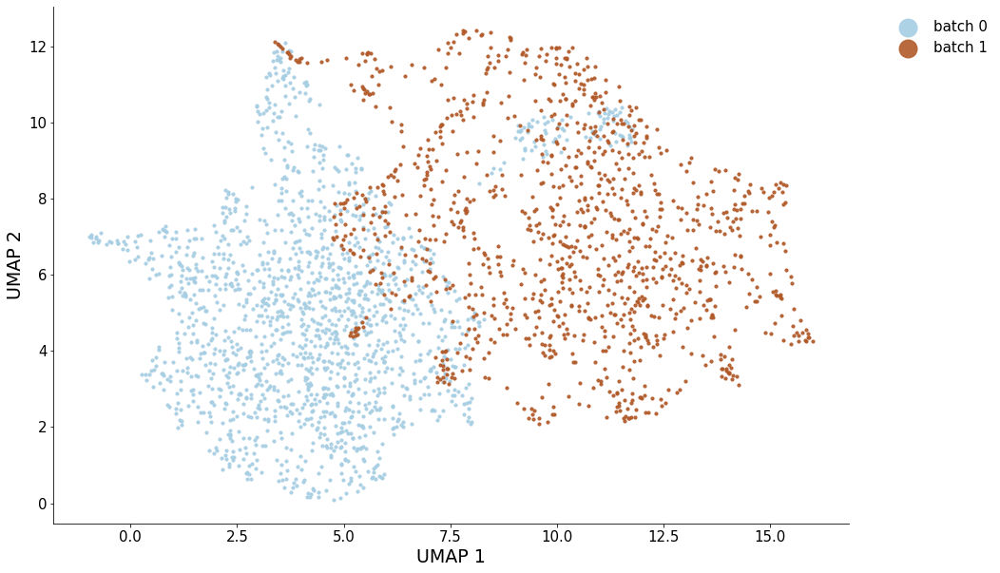

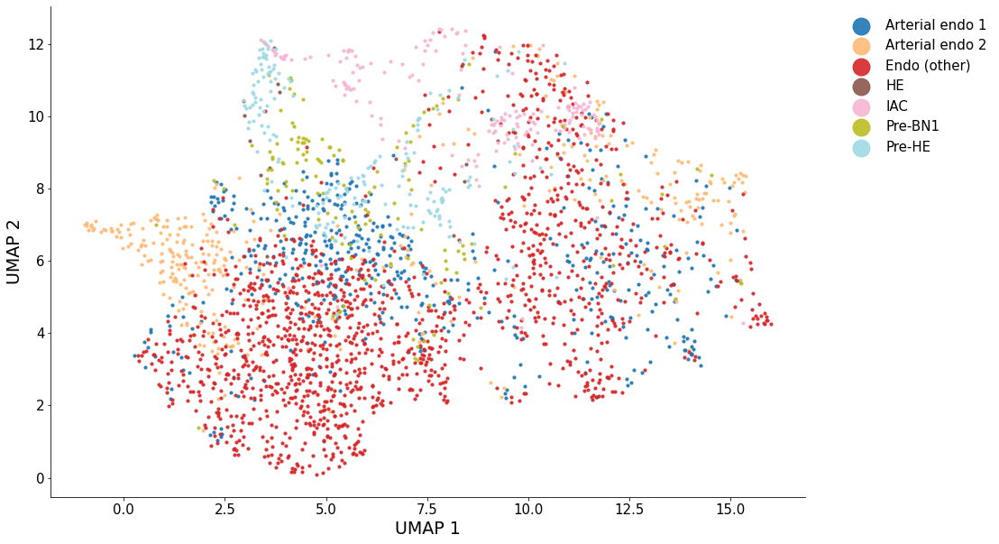

In [44]:
umap_op = UMAP(n_components = 2, n_neighbors = 15, min_dist = 0.4, random_state = 0) 
zs = []
x_umaps = []
labels = []
prec_labels = []
pre_labels = []
for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    # z = model1.C_cells[batch].cpu().detach().numpy()
    zs.append(z)
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch + 1) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    pre_labels.append(np.argmax(z, axis = 1).squeeze())
    x_umaps.append(umap_op.fit_transform(z))

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, figsize = (10,15), axis_label = "UMAP")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)


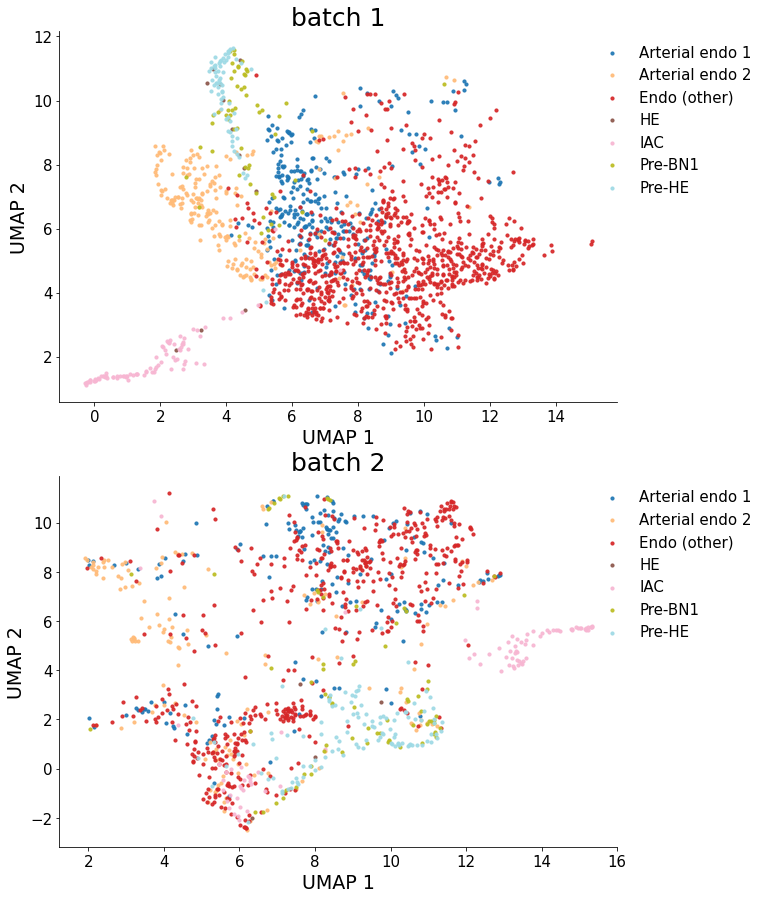

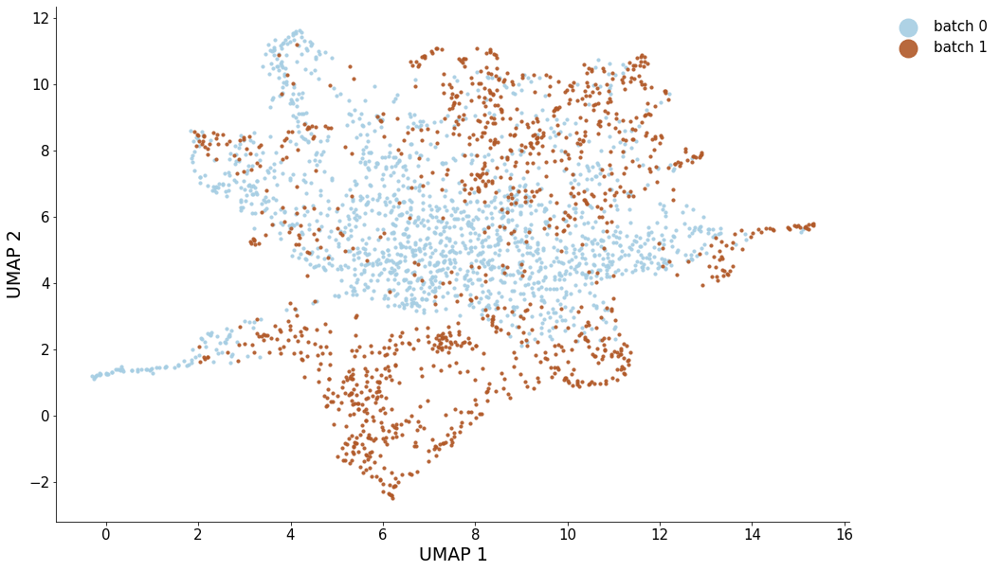

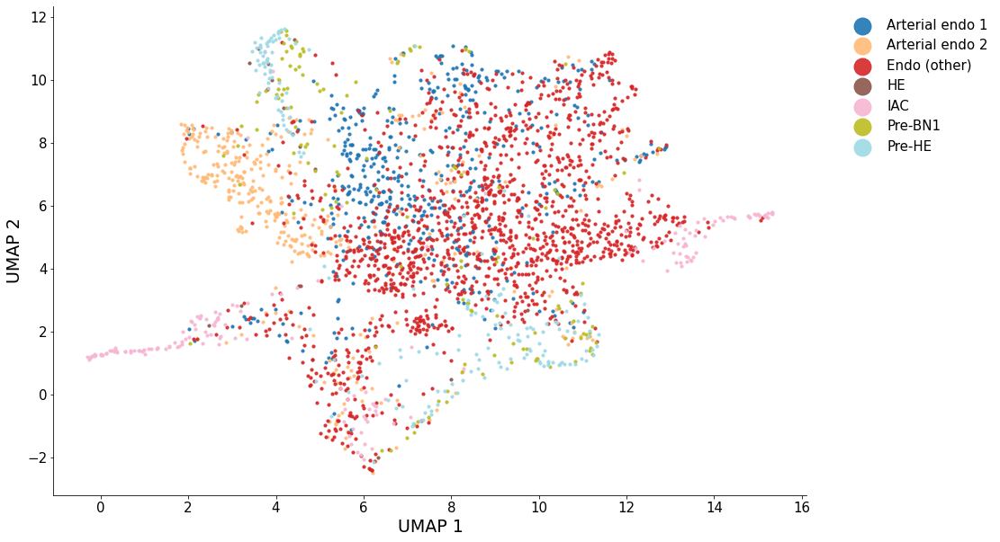

In [36]:
umap_op = UMAP(n_components = 2, n_neighbors = 15, min_dist = 0.4, random_state = 0) 
zs = []
labels = []
prec_labels = []
pre_labels = []
for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    # z = model1.C_cells[batch].cpu().detach().numpy()
    zs.append(z)
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch + 1) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    pre_labels.append(np.argmax(z, axis = 1).squeeze())

x_umap = umap_op.fit_transform(np.concatenate(zs, axis = 0))
# separate into batches
x_umaps = []
for batch in range(0,2):
    if batch == 0:
        start_pointer = 0
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])
    elif batch == 1:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        x_umaps.append(x_umap[start_pointer:,:])
    else:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, figsize = (10,15), axis_label = "UMAP")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)


../src/umap_batch.py:1746: UserWarning: using precomputed metric; transform will be unavailable for new data and inverse_transform will be unavailable for all data
  warn(


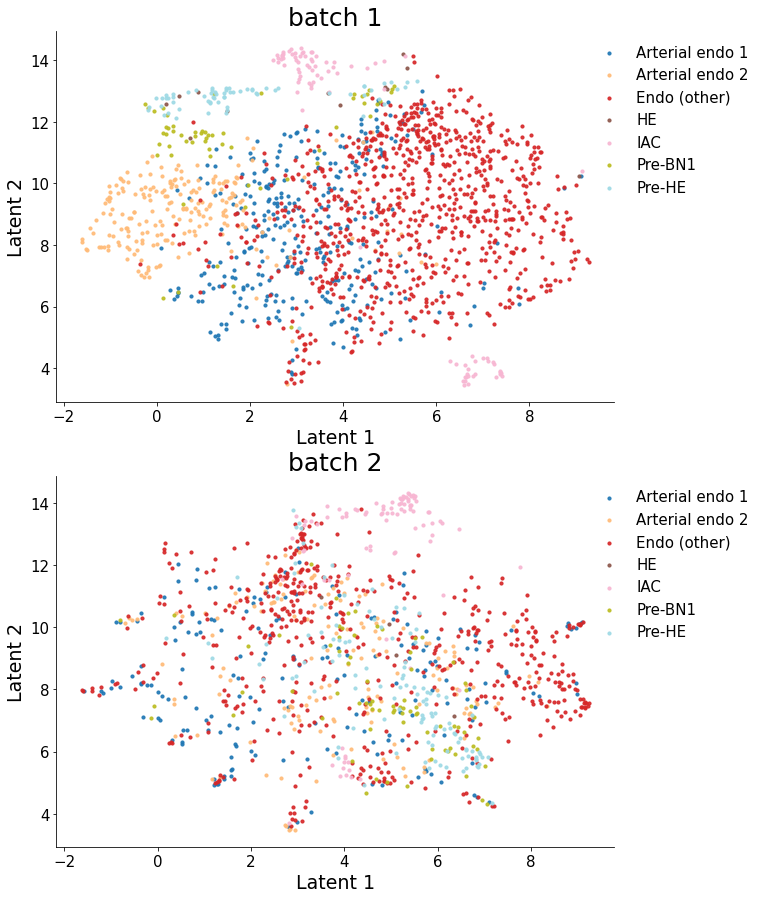

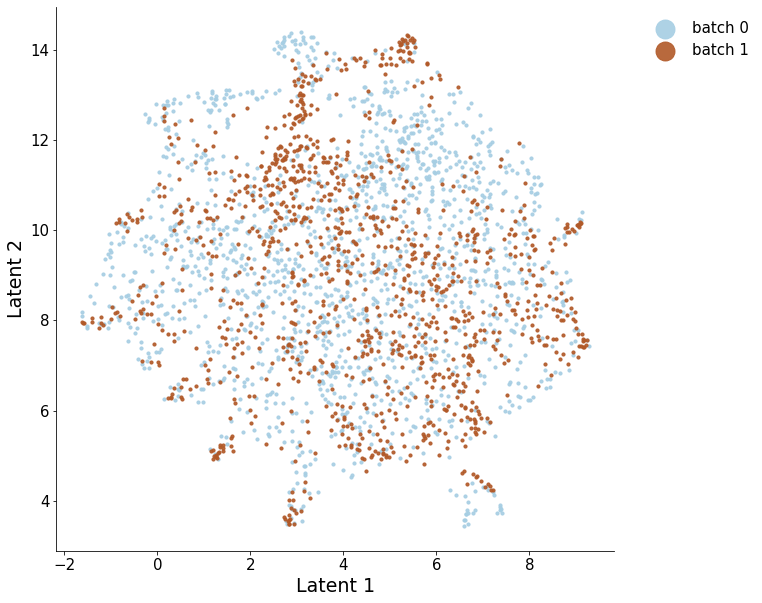

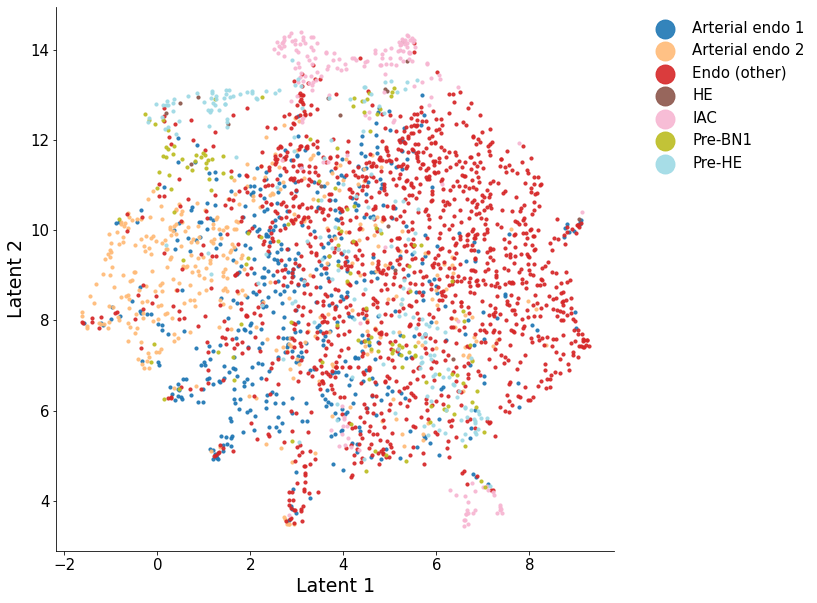

In [14]:
n_neighbors = 10

zs = []
labels = []
prec_labels = []
pre_labels = []
for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    # z = model1.C_cells[batch].cpu().detach().numpy()
    zs.append(z)
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch + 1) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    pre_labels.append(np.argmax(z, axis = 1).squeeze())

s_pair_dist, knn_indices, knn_dists = re_nn_distance(zs, n_neighbors)

umap_op = UMAP(n_components = 2, n_neighbors = n_neighbors, min_dist = 0.4, random_state = 0, 
                metric='precomputed', knn_dists=knn_dists, knn_indices=knn_indices)
x_umap = umap_op.fit_transform(s_pair_dist)
# separate into batches
x_umaps = []
for batch in range(0,2):
    if batch == 0:
        start_pointer = 0
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])
    elif batch == 1:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        x_umaps.append(x_umap[start_pointer:,:])
    else:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, 
                      figsize = (10,15), axis_label = "Latent")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, 
                      figsize = (10,10), axis_label = "Latent", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, 
                      figsize = (10,10), axis_label = "Latent", markerscale = 6)


RNA
(1628, 1789)
[[0 0 0 ... 0 8 0]
 [0 0 0 ... 0 3 0]
 [0 1 1 ... 0 0 0]
 ...
 [0 0 4 ... 1 0 0]
 [0 0 5 ... 0 8 0]
 [0 0 1 ... 0 1 0]]
ATAC
(1186, 13955)
sparsity: 0.1174


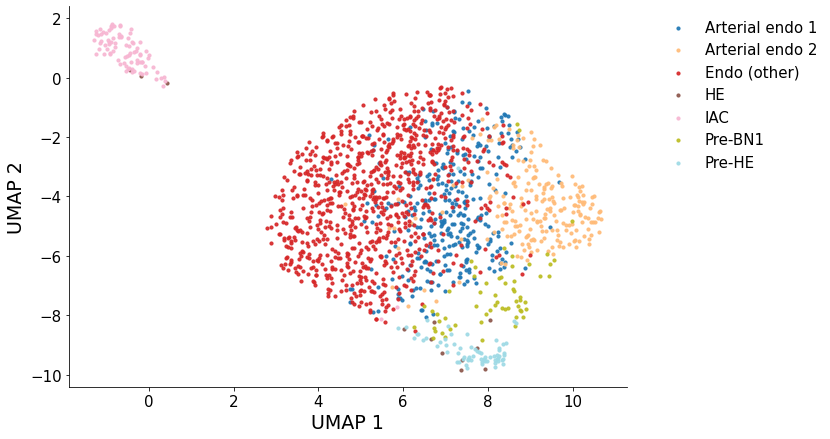

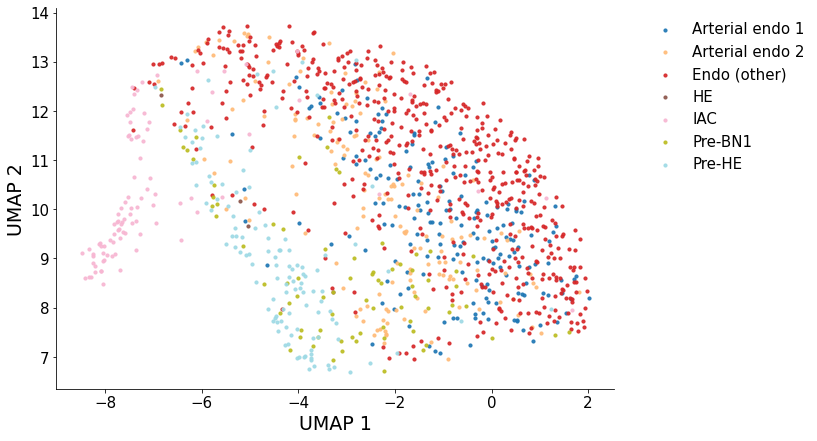

In [45]:
# read in dataset
dir = '../data/real/diag/Endo/'

counts_rnas = []
counts_atacs = []
counts_proteins = []
labels = []
for batch in [1, 2]:
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    
    try:
        counts_atac = np.array(sp.load_npz(os.path.join(dir, 'RxC' + str(batch) + ".npz")).todense().T)
        print("ATAC")
        print(counts_atac.shape)
        counts_atac = utils.preprocess(counts_atac, modality = "ATAC")
        print("sparsity: {:.4f}".format(np.sum(counts_atac != 0)/(counts_atac.shape[0] * counts_atac.shape[1])))
        
        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_atac)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")
        
    except:
        counts_atac = None
        
    try:
        counts_rna = np.array(sp.load_npz(os.path.join(dir, 'GxC' + str(batch) + ".npz")).todense().T)
        print("RNA")
        print(counts_rna.shape)
        print(counts_rna)
        counts_rna = utils.preprocess(counts_rna, modality = "RNA")

        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_rna)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")

    except:
        counts_rna = None
    
    # preprocess the count matrix
    counts_rnas.append(counts_rna)
    counts_atacs.append(counts_atac)

counts = {"rna":counts_rnas, "atac": counts_atacs}

A = sp.load_npz(os.path.join(dir, 'GxR.npz'))
A = np.array(A.todense())
# normalize A
A = utils.preprocess(A, modality = "interaction")
interacts = {"rna_atac": A}


# obtain the feature name
genes = pd.read_csv(dir + "genes.txt", header = None).values.squeeze()
regions = pd.read_csv(dir + "regions.txt", header = None).values.squeeze()

feats_name = {"rna": genes, "atac": regions}
counts["feats_name"] = feats_name

# new
counts["rna"][1] = counts["atac"][1] @ interacts["rna_atac"].T
interacts = None

# normalization? 
# quantile
# counts["rna"][1] = quantile_norm(targ_mtx = counts["rna"][1], ref_mtx = counts["rna"][0], replace = True)
# counts["rna"][1] = utils.preprocess(counts["rna"][1], modality = "RNA")

Input sanity check...
Finished.
Epoch 1000, Validating Loss: 144.7752
	 loss 1: 0.14477
	 loss 2: 0.00058
	 loss 3: 0.00000
Epoch 2000, Validating Loss: 143.3439
	 loss 1: 0.14334
	 loss 2: 0.00253
	 loss 3: 0.00000
Epoch 3000, Validating Loss: 142.6247
	 loss 1: 0.14262
	 loss 2: 0.00521
	 loss 3: 0.00000
Epoch 4000, Validating Loss: 142.1698
	 loss 1: 0.14217
	 loss 2: 0.00359
	 loss 3: 0.00000
Epoch 5000, Validating Loss: 141.7889
	 loss 1: 0.14178
	 loss 2: 0.00414
	 loss 3: 0.00000
Epoch 6000, Validating Loss: 141.5862
	 loss 1: 0.14158
	 loss 2: 0.00335
	 loss 3: 0.00000
running time: 92.00578546524048


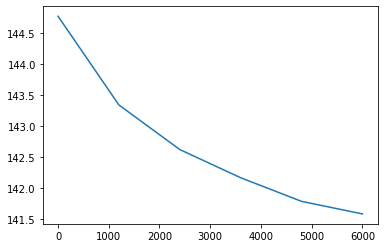

In [46]:
#hyper parameters: best lr = 5e-3, T = 4000, latent_dims = 13
alpha = [1000, 1, 5]
# alpha = [1000, 0, 0]
batchsize = 0.1
run = 0
K = 30
Ns = [K] * 2
N_feat = Ns[0]
interval = 1000
T = 6000
lr = 1e-2

# use interaction matrix
start_time = time.time()
model1 = model.cfrm_vanilla(counts = counts, interacts = interacts, Ns = Ns, K = K, N_feat = N_feat, batch_size = batchsize, interval = interval, lr = lr, alpha = alpha, seed = run).to(device)
losses1 = model1.train_func(T = T)
end_time = time.time()
print("running time: " + str(end_time - start_time))

x = np.linspace(0, T, int(T/interval))
plt.plot(x, losses1)

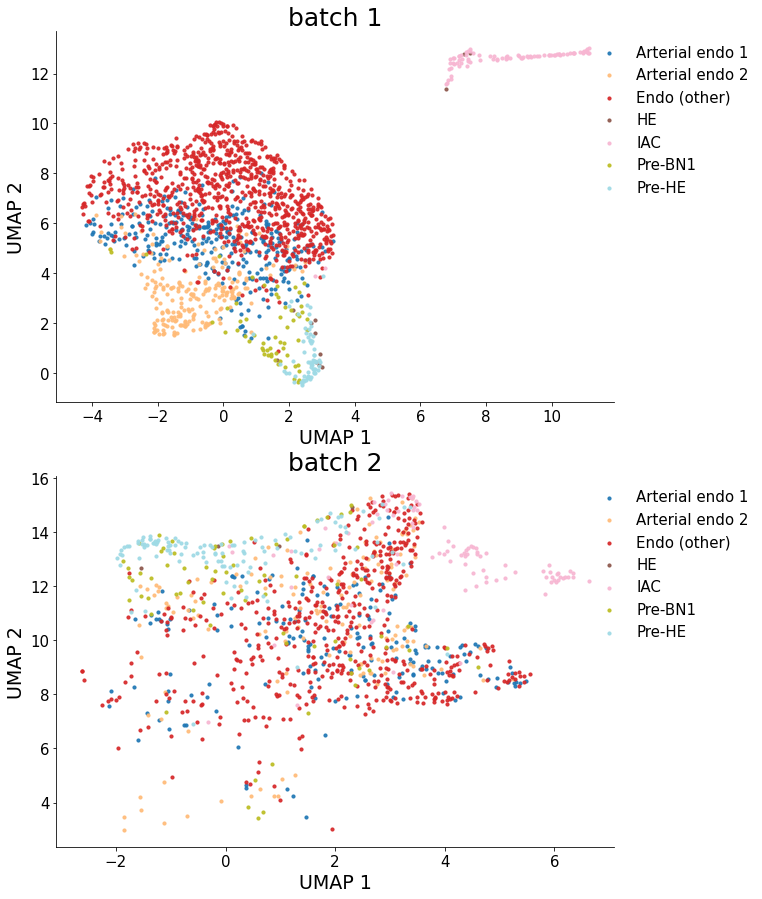

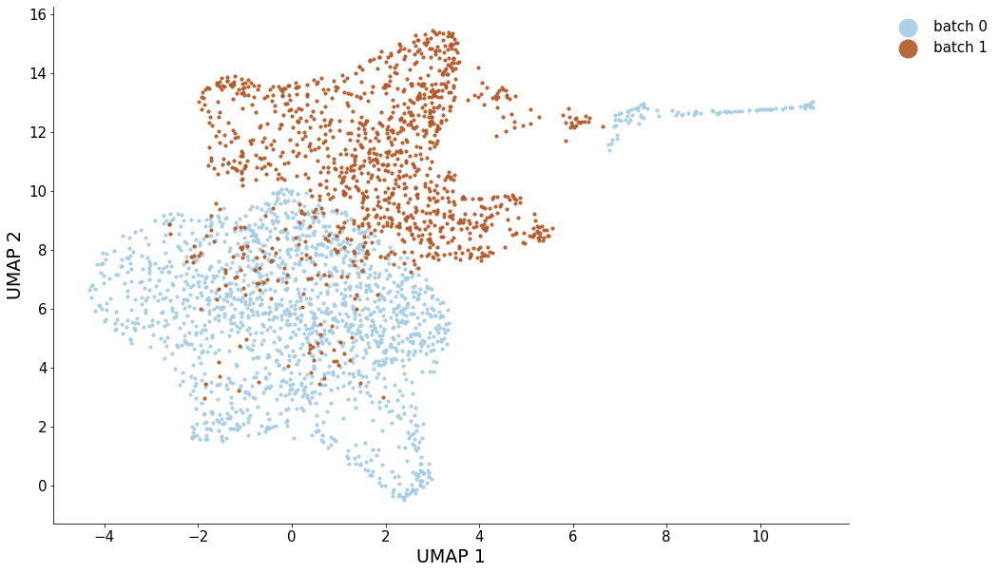

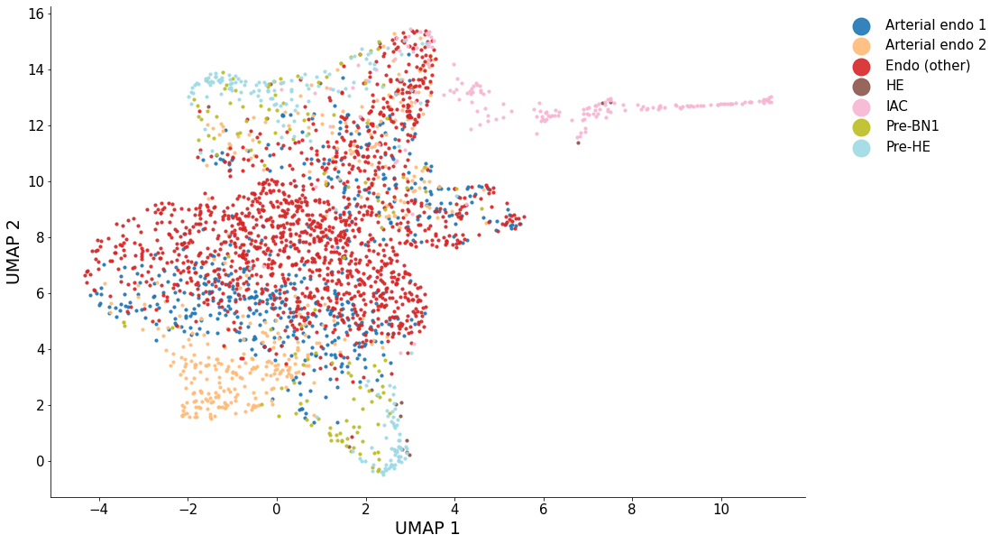

In [47]:
umap_op = UMAP(n_components = 2, n_neighbors = 15, min_dist = 0.4, random_state = 0) 
zs = []
labels = []
prec_labels = []
pre_labels = []
for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    # z = model1.C_cells[batch].cpu().detach().numpy()
    zs.append(z)
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch + 1) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    pre_labels.append(np.argmax(z, axis = 1).squeeze())

x_umap = umap_op.fit_transform(np.concatenate(zs, axis = 0))
# separate into batches
x_umaps = []
for batch in range(0,2):
    if batch == 0:
        start_pointer = 0
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])
    elif batch == 1:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        x_umaps.append(x_umap[start_pointer:,:])
    else:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, figsize = (10,15), axis_label = "UMAP")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)


../src/umap_batch.py:1746: UserWarning: using precomputed metric; transform will be unavailable for new data and inverse_transform will be unavailable for all data
  warn(


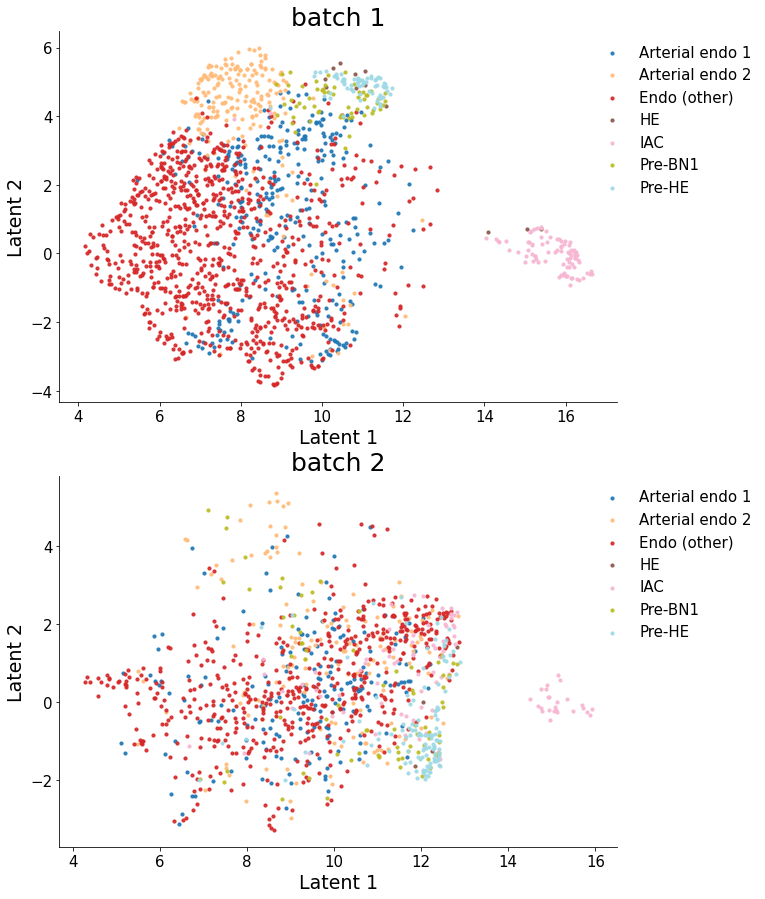

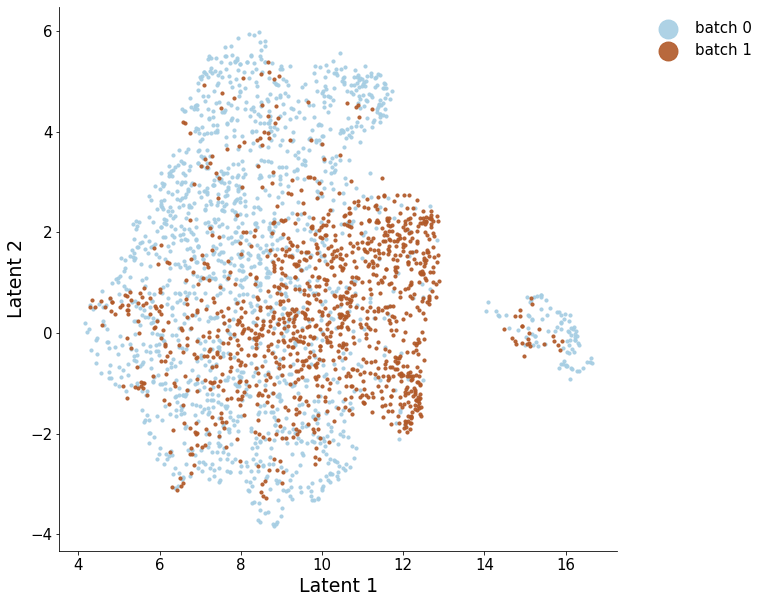

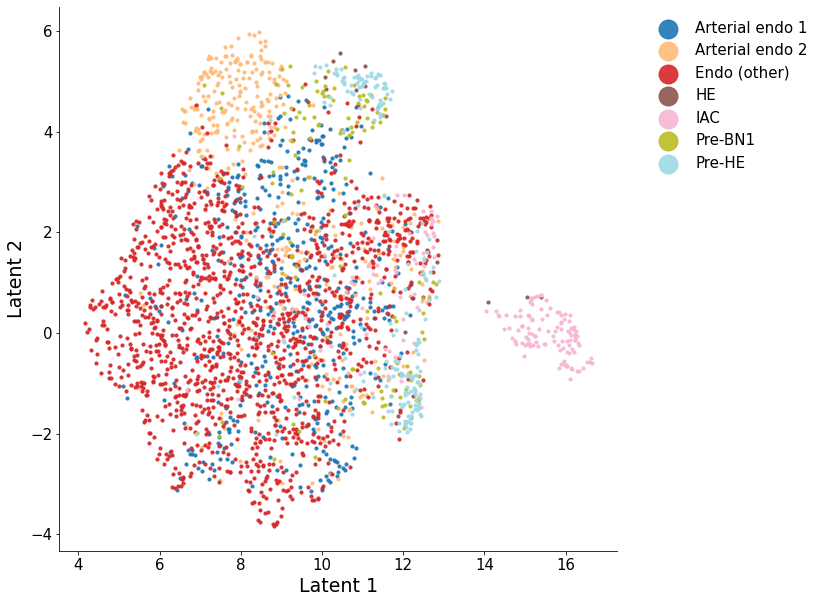

In [48]:
n_neighbors = 10

zs = []
labels = []
prec_labels = []
pre_labels = []
for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    # z = model1.C_cells[batch].cpu().detach().numpy()
    zs.append(z)
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch + 1) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    pre_labels.append(np.argmax(z, axis = 1).squeeze())

s_pair_dist, knn_indices, knn_dists = re_nn_distance(zs, n_neighbors)

umap_op = UMAP(n_components = 2, n_neighbors = n_neighbors, min_dist = 0.4, random_state = 0, 
                metric='precomputed', knn_dists=knn_dists, knn_indices=knn_indices)
x_umap = umap_op.fit_transform(s_pair_dist)
# separate into batches
x_umaps = []
for batch in range(0,2):
    if batch == 0:
        start_pointer = 0
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])
    elif batch == 1:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        x_umaps.append(x_umap[start_pointer:,:])
    else:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, 
                      figsize = (10,15), axis_label = "Latent")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, 
                      figsize = (10,10), axis_label = "Latent", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, 
                      figsize = (10,10), axis_label = "Latent", markerscale = 6)


RNA
(1628, 1789)
[[0 0 0 ... 0 8 0]
 [0 0 0 ... 0 3 0]
 [0 1 1 ... 0 0 0]
 ...
 [0 0 4 ... 1 0 0]
 [0 0 5 ... 0 8 0]
 [0 0 1 ... 0 1 0]]
ATAC
(1186, 13955)
sparsity: 0.1174


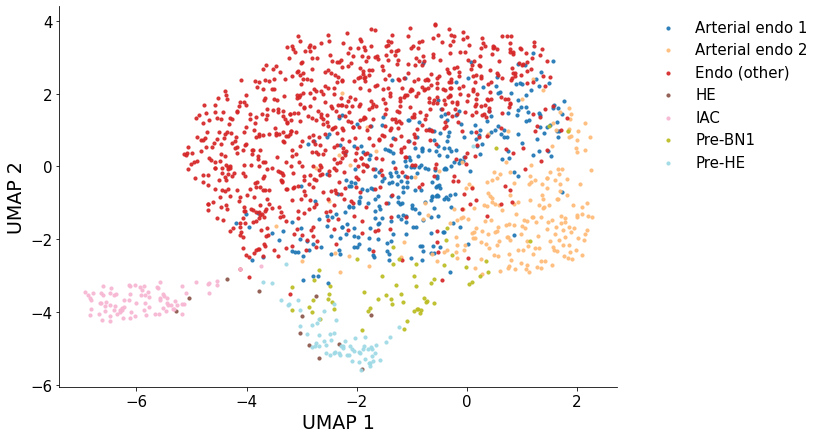

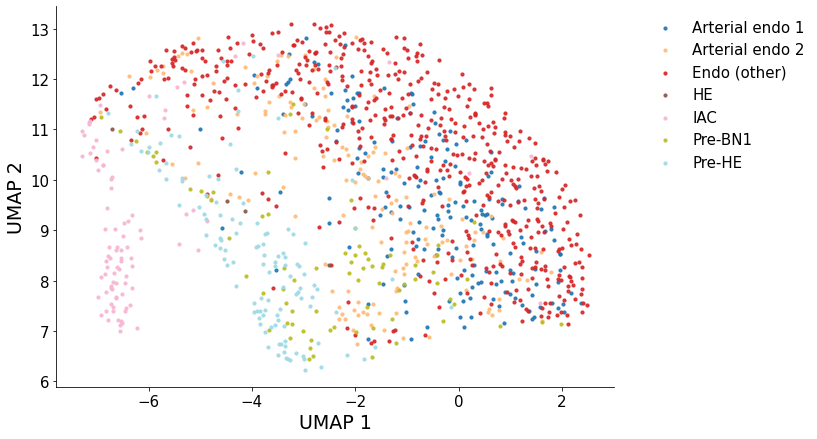

In [49]:
# read in dataset
dir = '../data/real/diag/Endo/'

counts_rnas = []
counts_atacs = []
counts_proteins = []
labels = []
for batch in [1, 2]:
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    
    try:
        counts_atac = np.array(sp.load_npz(os.path.join(dir, 'RxC' + str(batch) + ".npz")).todense().T)
        print("ATAC")
        print(counts_atac.shape)
        counts_atac = utils.preprocess(counts_atac, modality = "ATAC")
        print("sparsity: {:.4f}".format(np.sum(counts_atac != 0)/(counts_atac.shape[0] * counts_atac.shape[1])))
        
        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_atac)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")
        
    except:
        counts_atac = None
        
    try:
        counts_rna = np.array(sp.load_npz(os.path.join(dir, 'GxC' + str(batch) + ".npz")).todense().T)
        print("RNA")
        print(counts_rna.shape)
        print(counts_rna)
        counts_rna = utils.preprocess(counts_rna, modality = "RNA")

        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_rna)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")

    except:
        counts_rna = None
    
    # preprocess the count matrix
    counts_rnas.append(counts_rna)
    counts_atacs.append(counts_atac)

counts = {"rna":counts_rnas, "atac": counts_atacs}

A = sp.load_npz(os.path.join(dir, 'GxR.npz'))
A = np.array(A.todense())
# normalize A
A = utils.preprocess(A, modality = "interaction")
interacts = {"rna_atac": A}


# obtain the feature name
genes = pd.read_csv(dir + "genes.txt", header = None).values.squeeze()
regions = pd.read_csv(dir + "regions.txt", header = None).values.squeeze()

feats_name = {"rna": genes, "atac": regions}
counts["feats_name"] = feats_name

# new
counts["rna"][1] = counts["atac"][1] @ interacts["rna_atac"].T
interacts = None

# normalization? 
# quantile
# counts["rna"][1] = quantile_norm(targ_mtx = counts["rna"][1], ref_mtx = counts["rna"][0], replace = True)
counts["rna"][1] = utils.preprocess(counts["rna"][1], modality = "RNA")

Input sanity check...
Finished.
Epoch 1000, Validating Loss: 130.4209
	 loss 1: 0.13042
	 loss 2: 0.00058
	 loss 3: 0.00000
Epoch 2000, Validating Loss: 128.9156
	 loss 1: 0.12891
	 loss 2: 0.00253
	 loss 3: 0.00000
Epoch 3000, Validating Loss: 128.2394
	 loss 1: 0.12823
	 loss 2: 0.00521
	 loss 3: 0.00000
Epoch 4000, Validating Loss: 127.8351
	 loss 1: 0.12783
	 loss 2: 0.00359
	 loss 3: 0.00000
Epoch 5000, Validating Loss: 127.5172
	 loss 1: 0.12751
	 loss 2: 0.00414
	 loss 3: 0.00000
Epoch 6000, Validating Loss: 127.3329
	 loss 1: 0.12733
	 loss 2: 0.00335
	 loss 3: 0.00000
running time: 90.02536725997925


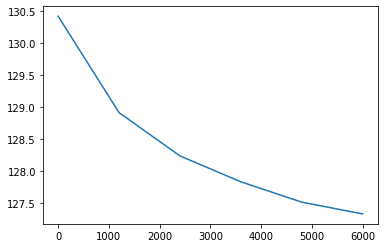

In [50]:
#hyper parameters: best lr = 5e-3, T = 4000, latent_dims = 13
alpha = [1000, 1, 5]
# alpha = [1000, 0, 0]
batchsize = 0.1
run = 0
K = 30
Ns = [K] * 2
N_feat = Ns[0]
interval = 1000
T = 6000
lr = 1e-2

# use interaction matrix
start_time = time.time()
model1 = model.cfrm_vanilla(counts = counts, interacts = interacts, Ns = Ns, K = K, N_feat = N_feat, batch_size = batchsize, interval = interval, lr = lr, alpha = alpha, seed = run).to(device)
losses1 = model1.train_func(T = T)
end_time = time.time()
print("running time: " + str(end_time - start_time))

x = np.linspace(0, T, int(T/interval))
plt.plot(x, losses1)

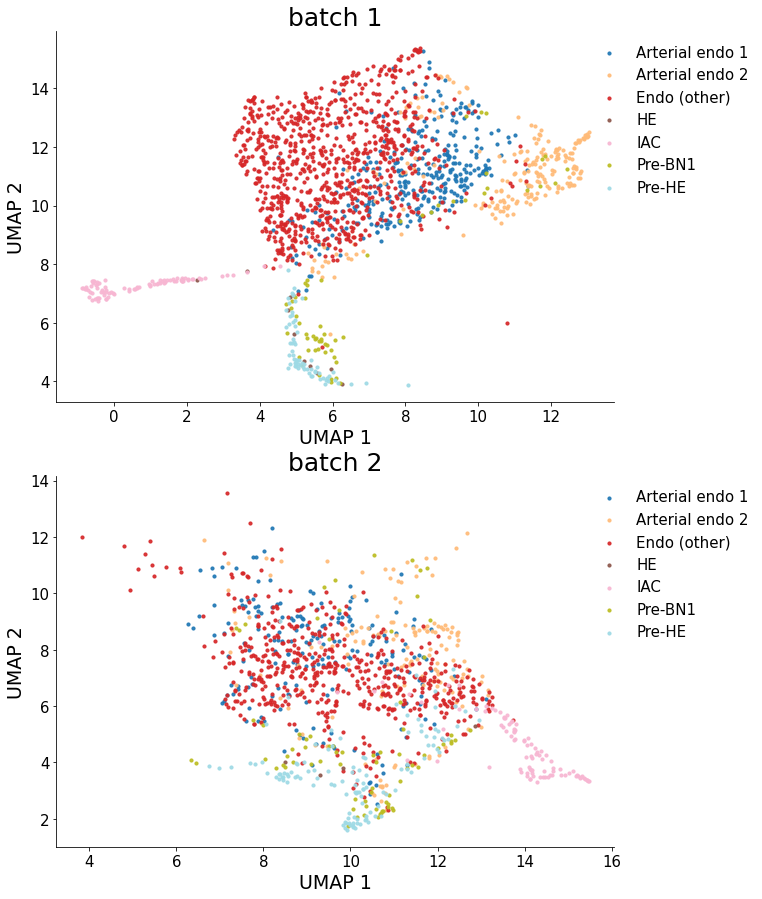

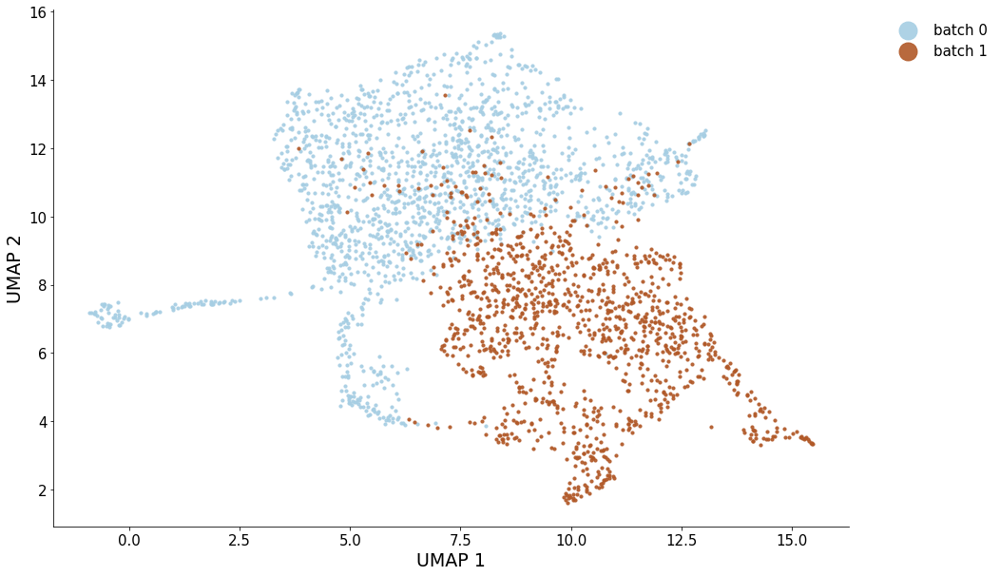

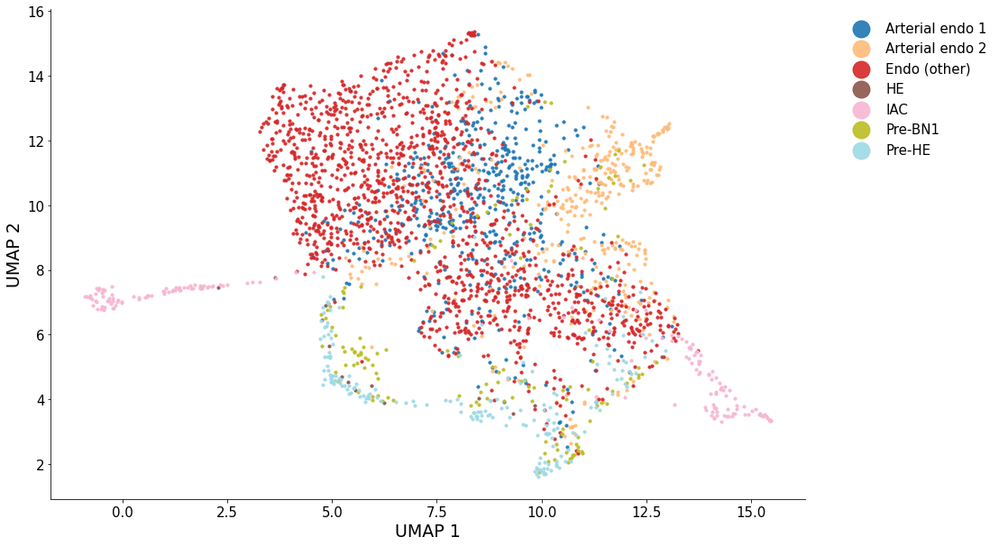

In [51]:
umap_op = UMAP(n_components = 2, n_neighbors = 15, min_dist = 0.4, random_state = 0) 
zs = []
labels = []
prec_labels = []
pre_labels = []
for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    # z = model1.C_cells[batch].cpu().detach().numpy()
    zs.append(z)
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch + 1) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    pre_labels.append(np.argmax(z, axis = 1).squeeze())

x_umap = umap_op.fit_transform(np.concatenate(zs, axis = 0))
# separate into batches
x_umaps = []
for batch in range(0,2):
    if batch == 0:
        start_pointer = 0
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])
    elif batch == 1:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        x_umaps.append(x_umap[start_pointer:,:])
    else:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, figsize = (10,15), axis_label = "UMAP")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)


../src/umap_batch.py:1746: UserWarning: using precomputed metric; transform will be unavailable for new data and inverse_transform will be unavailable for all data
  warn(


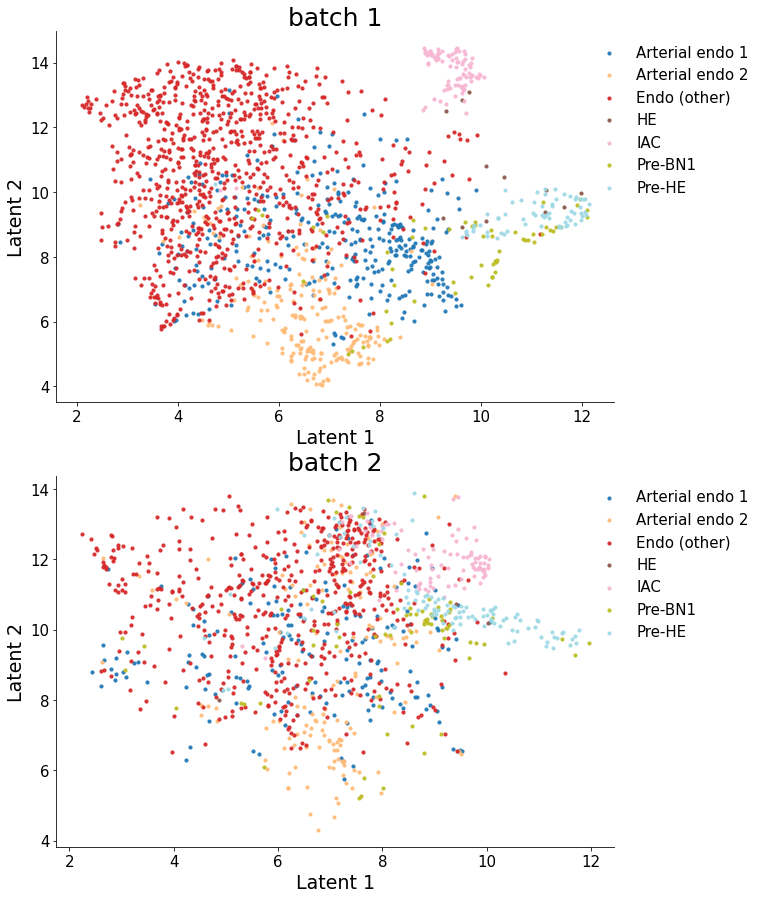

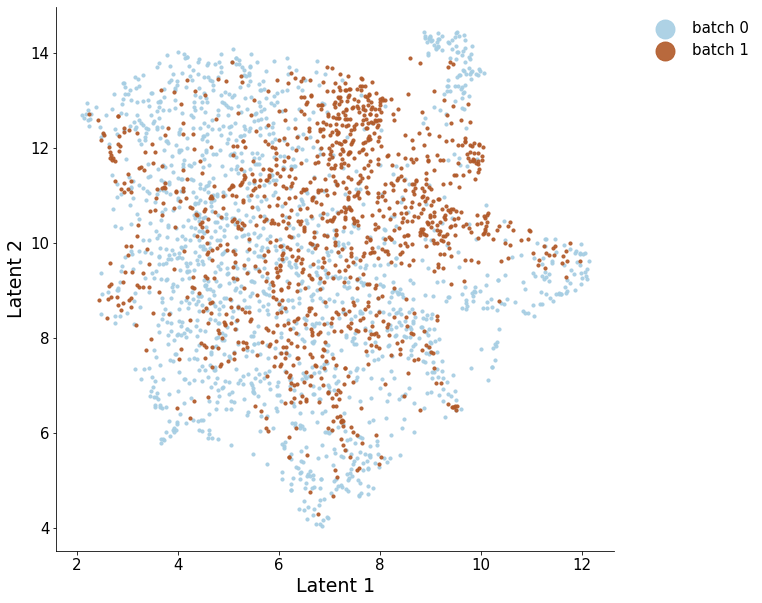

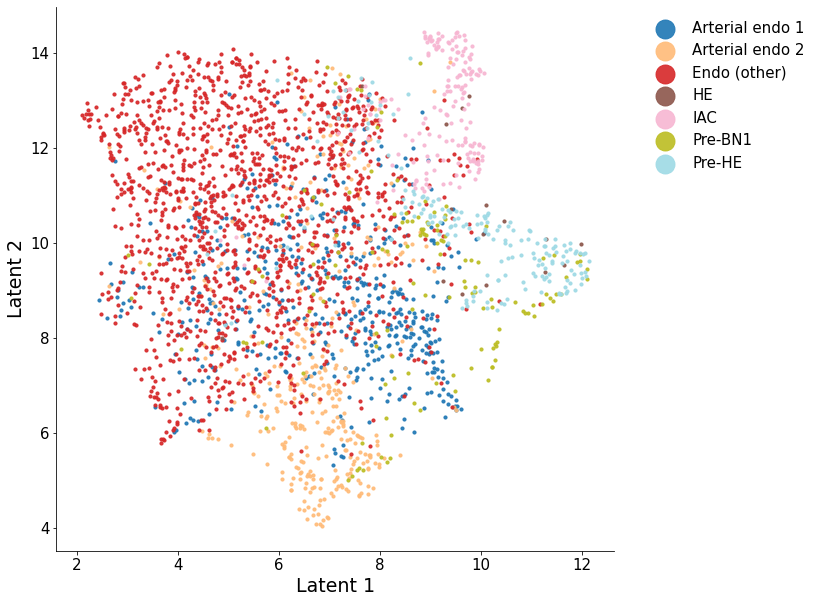

In [52]:
n_neighbors = 10

zs = []
labels = []
prec_labels = []
pre_labels = []
for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    # z = model1.C_cells[batch].cpu().detach().numpy()
    zs.append(z)
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch + 1) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    pre_labels.append(np.argmax(z, axis = 1).squeeze())

s_pair_dist, knn_indices, knn_dists = re_nn_distance(zs, n_neighbors)

umap_op = UMAP(n_components = 2, n_neighbors = n_neighbors, min_dist = 0.4, random_state = 0, 
                metric='precomputed', knn_dists=knn_dists, knn_indices=knn_indices)
x_umap = umap_op.fit_transform(s_pair_dist)
# separate into batches
x_umaps = []
for batch in range(0,2):
    if batch == 0:
        start_pointer = 0
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])
    elif batch == 1:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        x_umaps.append(x_umap[start_pointer:,:])
    else:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, 
                      figsize = (10,15), axis_label = "Latent")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, 
                      figsize = (10,10), axis_label = "Latent", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, 
                      figsize = (10,10), axis_label = "Latent", markerscale = 6)


## Cardiac

RNA
(254, 1610)
[[  0.   0.   0. ...   0.   0.  38.]
 [  0.   0.  30. ... 189.   1. 463.]
 [  0.   0. 100. ...   3.  74.  40.]
 ...
 [  5.   0.   0. ...   0.   0.  70.]
 [  0.   0.   0. ...   0.   0.   5.]
 [ 11.   0.   0. ...   2.   0. 168.]]
ATAC
(695, 5373)
sparsity: 0.2854


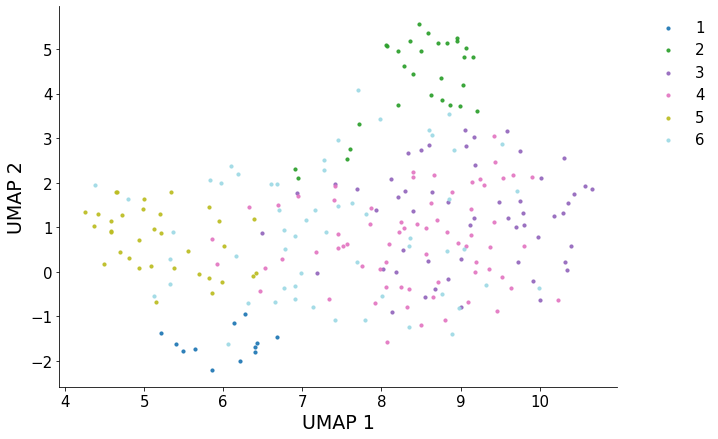

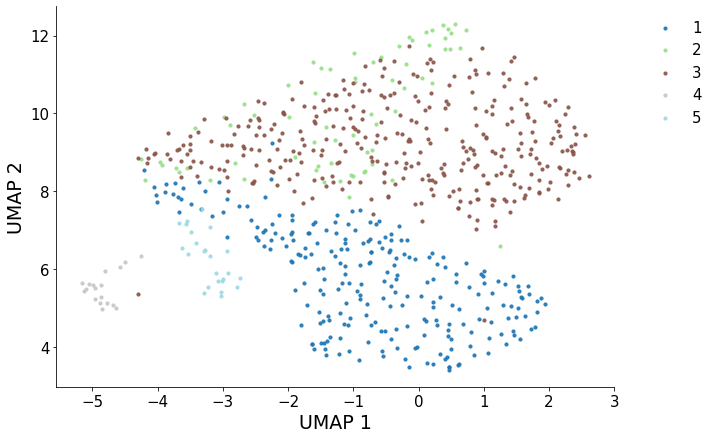

In [63]:
# read in dataset
dir = '../data/real/diag/CDC/'

counts_rnas = []
counts_atacs = []
counts_proteins = []
labels = []
for batch in [1, 2]:
    label = pd.read_csv(os.path.join(dir, 'meta_c' + str(batch) + '.csv'), index_col=0)["cell_type"].values.squeeze()
    label = np.where(np.isnan(label), 6, label).astype(np.int)
    labels.append(label)
    
    try:
        counts_atac = np.array(sp.load_npz(os.path.join(dir, 'RxC' + str(batch) + ".npz")).todense().T)
        print("ATAC")
        print(counts_atac.shape)
        counts_atac = utils.preprocess(counts_atac, modality = "ATAC")
        print("sparsity: {:.4f}".format(np.sum(counts_atac != 0)/(counts_atac.shape[0] * counts_atac.shape[1])))
        
        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_atac)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")
        
    except:
        counts_atac = None
        
    try:
        counts_rna = np.array(sp.load_npz(os.path.join(dir, 'GxC' + str(batch) + ".npz")).todense().T)
        print("RNA")
        print(counts_rna.shape)
        print(counts_rna)
        counts_rna = utils.preprocess(counts_rna, modality = "RNA")

        # PLOT FUNCTION
        x_pca = PCA(n_components = 100).fit_transform(counts_rna)
        x_umap = UMAP(n_components = 2, min_dist = 0.4, random_state = 0).fit_transform(x_pca)
        utils.plot_latent_ext([x_umap], annos = [labels[-1]], mode = "joint", save = None, figsize = (10,7), axis_label = "UMAP")

    except:
        counts_rna = None
    
    # preprocess the count matrix
    counts_rnas.append(counts_rna)
    counts_atacs.append(counts_atac)

counts = {"rna":counts_rnas, "atac": counts_atacs}

A = sp.load_npz(os.path.join(dir, 'GxR.npz'))
A = np.array(A.todense())
# normalize A
A = utils.preprocess(A, modality = "interaction")
interacts = {"rna_atac": A}


# obtain the feature name
genes = pd.read_csv(dir + "genes.txt", header = None).values.squeeze()
regions = pd.read_csv(dir + "regions.txt", header = None).values.squeeze()

feats_name = {"rna": genes, "atac": regions}
counts["feats_name"] = feats_name

Input sanity check...
Finished.
Epoch 1000, Validating Loss: 149.6139
	 loss 1: 0.15392
	 loss 2: 0.00052
	 loss 3: -0.86068
Epoch 2000, Validating Loss: 146.7177
	 loss 1: 0.15094
	 loss 2: 0.00139
	 loss 3: -0.84553
Epoch 3000, Validating Loss: 145.3348
	 loss 1: 0.14956
	 loss 2: 0.00274
	 loss 3: -0.84534
Epoch 4000, Validating Loss: 144.5204
	 loss 1: 0.14875
	 loss 2: 0.00159
	 loss 3: -0.84629
Epoch 5000, Validating Loss: 143.9726
	 loss 1: 0.14822
	 loss 2: 0.00208
	 loss 3: -0.84967
Epoch 6000, Validating Loss: 143.5878
	 loss 1: 0.14785
	 loss 2: 0.00273
	 loss 3: -0.85243
Epoch 7000, Validating Loss: 143.2911
	 loss 1: 0.14756
	 loss 2: 0.00166
	 loss 3: -0.85402
Epoch 8000, Validating Loss: 143.0610
	 loss 1: 0.14734
	 loss 2: 0.00357
	 loss 3: -0.85619
Epoch 9000, Validating Loss: 142.8633
	 loss 1: 0.14715
	 loss 2: 0.00225
	 loss 3: -0.85811
Epoch 10000, Validating Loss: 142.6978
	 loss 1: 0.14699
	 loss 2: 0.00322
	 loss 3: -0.85988
running time: 231.75093245506287


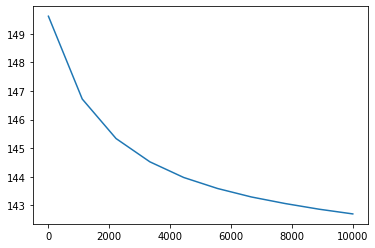

In [3]:
#hyper parameters: best lr = 5e-3, T = 4000, latent_dims = 13
alpha = [1000, 1, 5]
batchsize = 1
run = 0
K = 30
Ns = [K] * 2
N_feat = Ns[0]
interval = 1000
T = 10000
lr = 1e-2

# use interaction matrix
start_time = time.time()
model1 = model.cfrm_vanilla(counts = counts, interacts = interacts, Ns = Ns, K = K, N_feat = N_feat, batch_size = batchsize, interval = interval, lr = lr, alpha = alpha, seed = run).to(device)
losses1 = model1.train_func(T = T)
end_time = time.time()
print("running time: " + str(end_time - start_time))

x = np.linspace(0, T, int(T/interval))
plt.plot(x, losses1)

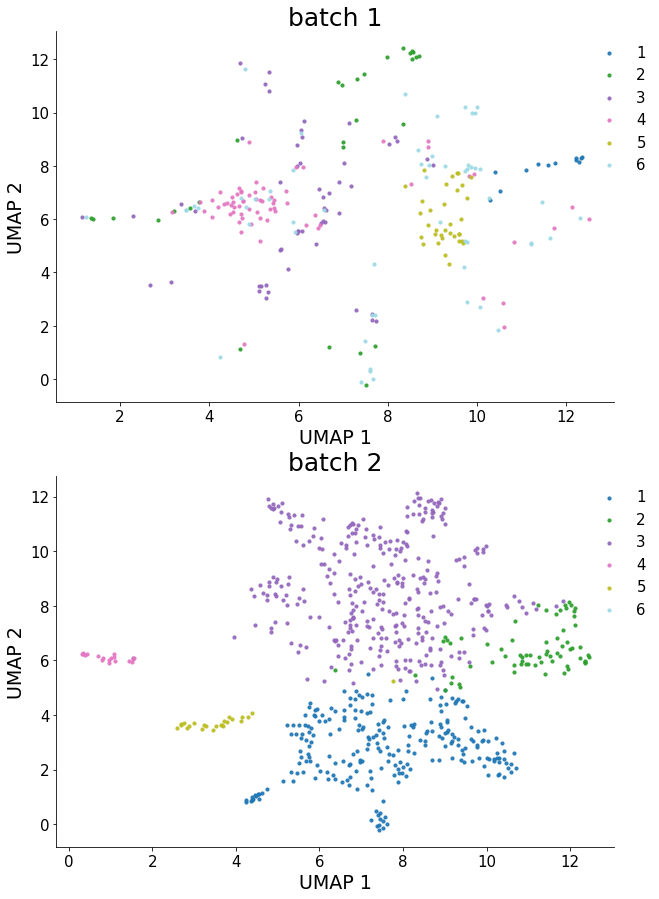

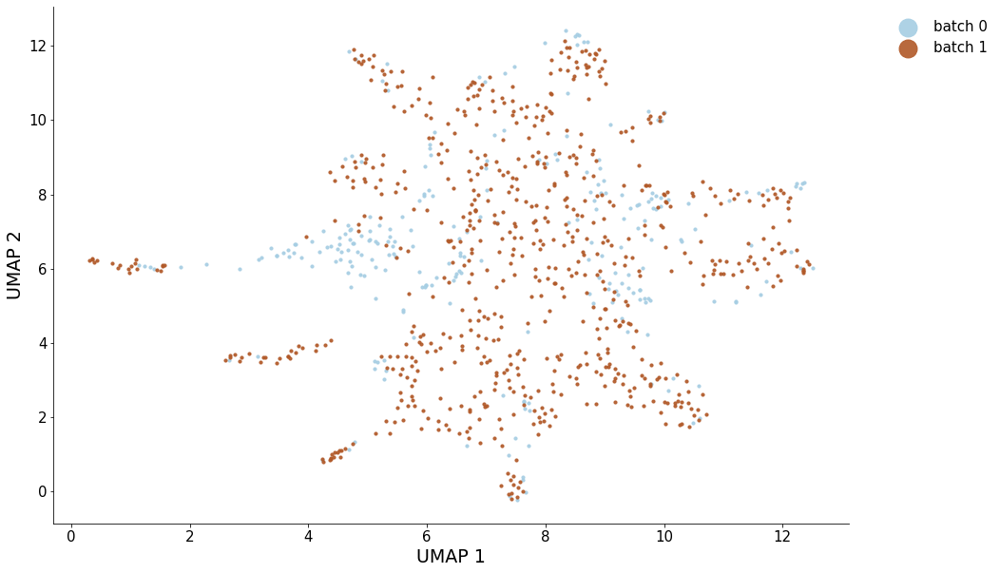

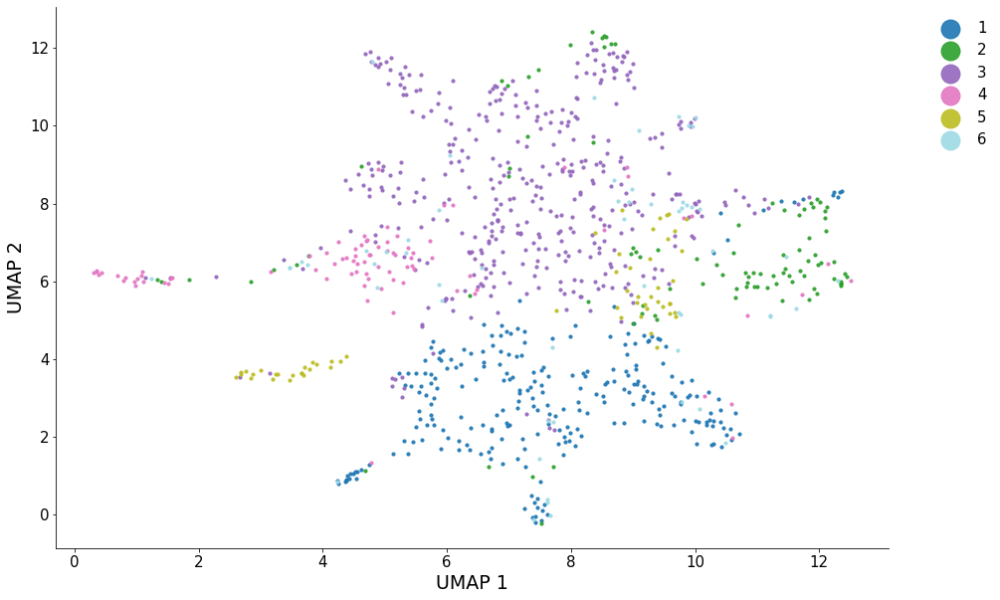

In [16]:
umap_op = UMAP(n_components = 2, n_neighbors = 15, min_dist = 0.4, random_state = 0) 
zs = []
labels = []
prec_labels = []
pre_labels = []
for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    # z = model1.C_cells[batch].cpu().detach().numpy()
    zs.append(z)
    label = pd.read_csv(os.path.join(dir, 'meta_c' + str(batch + 1) + '.csv'), index_col=0)["cell_type"].values.squeeze()
    label = np.where(np.isnan(label), 6, label).astype(np.int)
    labels.append(label)
    pre_labels.append(np.argmax(z, axis = 1).squeeze())

x_umap = umap_op.fit_transform(np.concatenate(zs, axis = 0))
# separate into batches
x_umaps = []
for batch in range(0,2):
    if batch == 0:
        start_pointer = 0
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])
    elif batch == 1:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        x_umaps.append(x_umap[start_pointer:,:])
    else:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, figsize = (10,15), axis_label = "UMAP")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, figsize = (15,10), axis_label = "UMAP", markerscale = 6)


../src/umap_batch.py:1746: UserWarning: using precomputed metric; transform will be unavailable for new data and inverse_transform will be unavailable for all data
  warn(


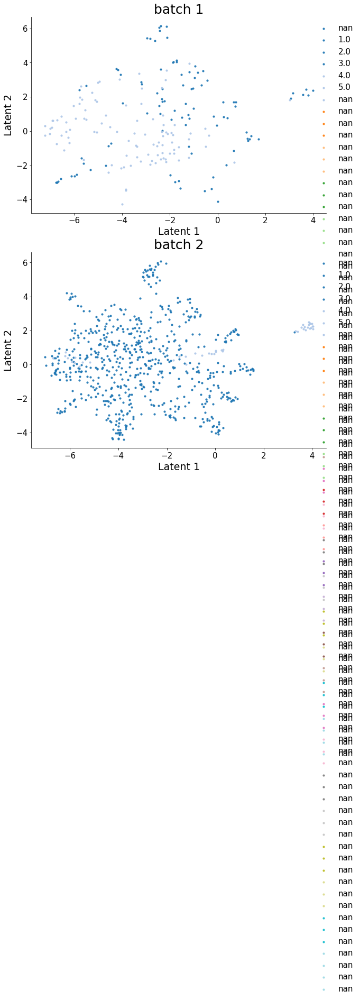

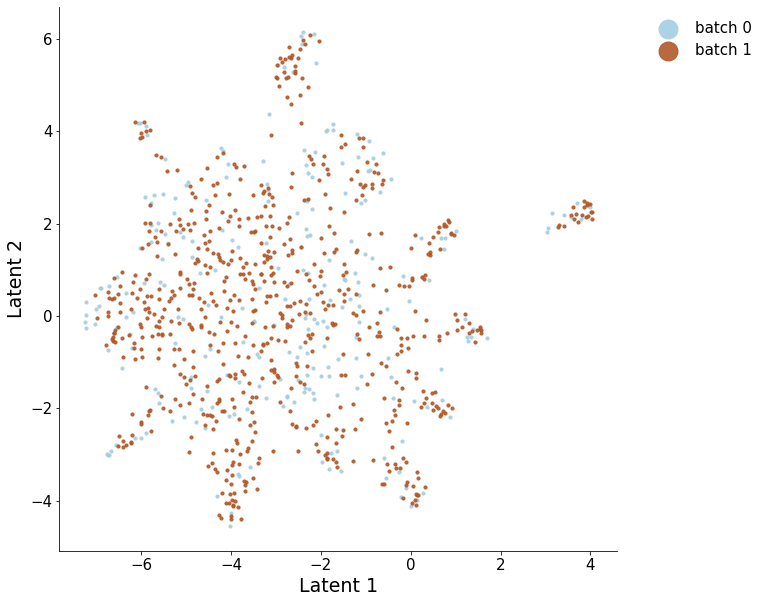

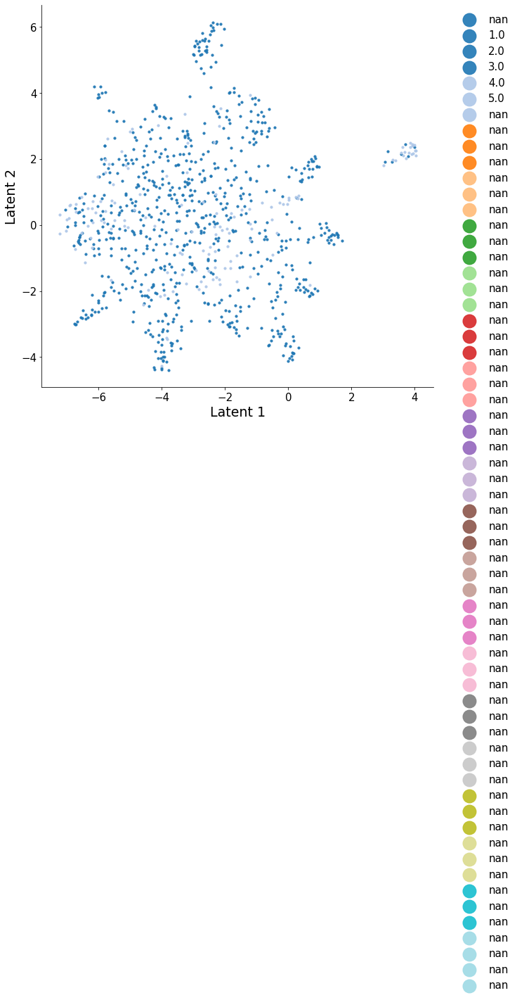

In [5]:
n_neighbors = 10

zs = []
labels = []
prec_labels = []
pre_labels = []
for batch in range(0,2):
    z = model1.softmax(model1.C_cells[str(batch)].cpu().detach()).numpy()
    # z = model1.C_cells[batch].cpu().detach().numpy()
    zs.append(z)
    labels.append(pd.read_csv(os.path.join(dir, 'meta_c' + str(batch + 1) + '.csv'), index_col=0)["cell_type"].values.squeeze())
    pre_labels.append(np.argmax(z, axis = 1).squeeze())

s_pair_dist, knn_indices, knn_dists = re_nn_distance(zs, n_neighbors)

umap_op = UMAP(n_components = 2, n_neighbors = n_neighbors, min_dist = 0.4, random_state = 0, 
                metric='precomputed', knn_dists=knn_dists, knn_indices=knn_indices)
x_umap = umap_op.fit_transform(s_pair_dist)
# separate into batches
x_umaps = []
for batch in range(0,2):
    if batch == 0:
        start_pointer = 0
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])
    elif batch == 1:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        x_umaps.append(x_umap[start_pointer:,:])
    else:
        start_pointer = start_pointer + zs[batch - 1].shape[0]
        end_pointer = start_pointer + zs[batch].shape[0]
        x_umaps.append(x_umap[start_pointer:end_pointer,:])

utils.plot_latent_ext(x_umaps, annos = labels, mode = "separate", save = None, 
                      figsize = (10,15), axis_label = "Latent")

utils.plot_latent_ext(x_umaps, annos = labels, mode = "modality", save = None, 
                      figsize = (10,10), axis_label = "Latent", markerscale = 6)

utils.plot_latent_ext(x_umaps, annos = labels, mode = "joint", save = None, 
                      figsize = (10,10), axis_label = "Latent", markerscale = 6)
